# Computer Vision (H02A5a): Group Assignment 2

**Group 6:** Kaixi Yao, Taicheng Liu, Zhenyang Li, Enmin Lin

## Abstract

This notebook reports our work on three deep learning tasks for the PASCAL VOC 2009 subset: multi-label image classification, semantic segmentation, and a white-box adversarial study on both trained models. For classification we use a ConvNeXt-Small backbone with AsymmetricLoss and reach a Kaggle classification Dice of `0.898`. For segmentation we examine four model families and converge on EoMT-DINOv3, fine-tuned with multi-scale test-time augmentation; combined with our classifier output the submission reaches `0.89139` on the public leaderboard. The adversarial study reaches a `100%` targeted success rate on the classifier and a `99.6%` prediction change rate on the segmenter under perturbations that are not visible to the eye. We then evaluate the segmenter on Cityscapes without any further training. The five-class transferable mIoU falls to `0.509`, well below the V17 in-distribution validation mIoU of `0.793`, and grounds our reflection on real-world deployment readiness.

## Summary of Results

The Kaggle leaderboard score is a single Dice averaged across all `1500` submission rows (`750` classification rows + `750` segmentation rows). A partial submission gets `0` on the empty half. Its displayed leaderboard number is therefore half the true Dice on the populated half. The first two rows below report measured Dice on individual halves; the third row is the joint score of the final merged submission.

| Task | Metric | Value | Scope | Method summary |
| --- | --- | --- | --- | --- |
| 2.1 Image classification | Kaggle Dice on classification half | **0.898** | 750 classification rows | ConvNeXt-Small 320, AsymmetricLoss, threshold calibration, horizontal-flip TTA |
| 2.1 + 2.2 final submission | Kaggle joint leaderboard score | **0.89139** | full 1500 rows | classification CSV merged with segmentation CSV |
| 2.2 Semantic segmentation (best validation) | mIoU on internal val | **0.793** | 37 segmentation-side val images | EoMT-DINOv3 fine-tune with multi-scale TTA |
| 2.3 Attack on classifier | PGD targeted success rate | **100%** | 64 validation images, GT does not contain `aeroplane` | eps = 0.03 (normalised), 10 PGD steps |
| 2.3 Attack on segmenter | CosPGD prediction change rate | **99.6%** | 37 validation images, full mask area | untargeted, eps = 6/255, 20 steps |
| 2.4 Cross-domain evaluation | Cityscapes 5-class transferable mIoU | **0.509** | 500 Cityscapes val images, overlap classes only | no Cityscapes training |

## How to read this notebook

The chapters follow the assignment's section numbering. Chapter 1 covers the data and the submission format. Chapter 2 reports the classification task (Section 2.1). Chapter 3 reports the segmentation task (Section 2.2). Chapter 4 reports the adversarial study (Section 2.3). Chapter 5 is the discussion (Section 2.4). The final cell rebuilds the leaderboard submission.

All heavy code lives in the attached Kaggle dataset under `/kaggle/input/<dataset-slug>/code/`. The notebook imports those modules and exposes only the call sites, so the report stays readable.

# 1. Overview, Data, and Submission Format

The assignment uses a subset of the PASCAL VOC 2009 dataset that has been re-released as a Kaggle competition. The training set contains 749 colour images with both multi-label class annotations and dense per-pixel segmentation masks. The test set contains 750 images for which only images are released; predictions are scored via Kaggle's hidden leaderboard. Across the dataset there are 20 foreground object classes plus background, and a single image may contain several classes, but each pixel belongs to exactly one class. Sections 2.1 and 2.2 train two separate models, one per task, both consuming the same training images.

In [1]:
# Standard imports and path indirection. The same notebook runs on Kaggle and
# on a local copy of the repository. On Kaggle the dataset can mount either
# at the flat /kaggle/input/<slug>/ layout (older notebooks) or at the
# /kaggle/input/datasets/<username>/<slug>/ layout (newer ones, which is
# what Kaggle gave this submission). Either layout is fine.
import sys
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

SUBMISSION_DATASET_SLUG = "kul-cv-ga2-group6-dataset"

if Path("/kaggle/input").exists():
    _comp_candidates = [
        Path("/kaggle/input/competitions/kul-computer-vision-ga-2-2026"),
        Path("/kaggle/input/kul-computer-vision-ga-2-2026"),
    ]
    COMPETITION_DATA_DIR = next((c for c in _comp_candidates if c.is_dir()), None)
    if COMPETITION_DATA_DIR is None:
        raise FileNotFoundError(
            "Could not find kul-computer-vision-ga-2-2026 under /kaggle/input/. "
            "Make sure the competition is added to the notebook inputs."
        )

    # The dataset can land at either flat or nested layouts depending on
    # how it was attached; we accept any path that actually contains our
    # code/data_overview.py marker.
    _ds_candidates = [
        Path(f"/kaggle/input/datasets/enminlin/{SUBMISSION_DATASET_SLUG}"),
        Path(f"/kaggle/input/{SUBMISSION_DATASET_SLUG}"),
    ]
    SUBMISSION_DATASET_DIR = next(
        (c for c in _ds_candidates if (c / "code" / "data_overview.py").is_file()),
        None,
    )
    if SUBMISSION_DATASET_DIR is None:
        raise FileNotFoundError(
            f"Could not find {SUBMISSION_DATASET_SLUG} under /kaggle/input/. "
            f"Tried: {[str(c) for c in _ds_candidates]}"
        )
else:
    here = Path.cwd().resolve()
    for parent in [here, *here.parents]:
        if (parent / "kaggle_submission" / "dataset" / "code").is_dir():
            REPO_ROOT = parent
            break
    else:
        raise FileNotFoundError("Could not locate kaggle_submission/ in any parent.")
    COMPETITION_DATA_DIR = REPO_ROOT / "kul-computer-vision-ga-2-2026"
    SUBMISSION_DATASET_DIR = REPO_ROOT / "kaggle_submission" / "dataset"

sys.path.insert(0, str(SUBMISSION_DATASET_DIR / "code"))

_running_on_kaggle = Path("/kaggle/input").exists()
print(f"Running on       : {'Kaggle' if _running_on_kaggle else 'local'}")
print(f"Competition data : {COMPETITION_DATA_DIR.name}{' (under /kaggle/input/)' if _running_on_kaggle else ' (under the project root)'}")
print(f"Submission assets: {SUBMISSION_DATASET_DIR.name}")


Running on       : local
Competition data : kul-computer-vision-ga-2-2026 (under the project root)
Submission assets: dataset


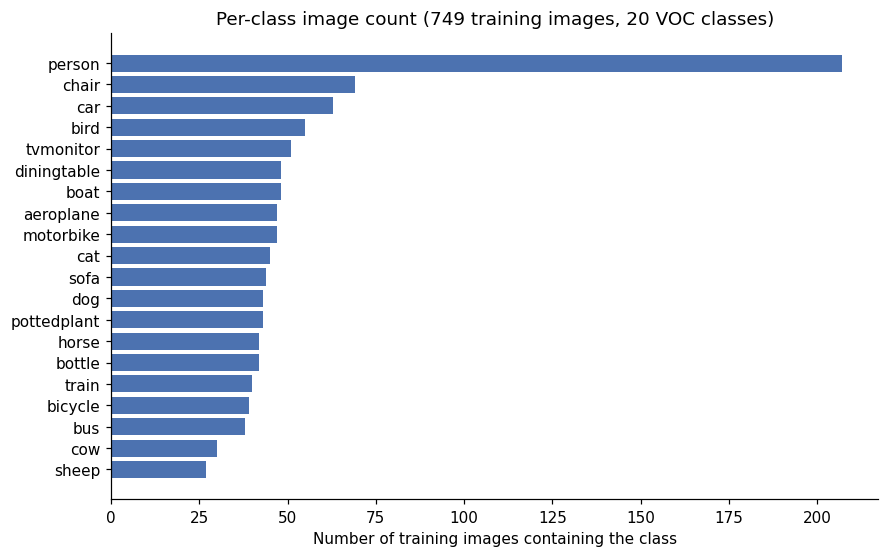

In [1]:
# Per-class image count across the 749 training images.
from data_overview import compute_class_distribution, plot_class_distribution

class_counts = compute_class_distribution(COMPETITION_DATA_DIR)
fig, ax = plt.subplots(figsize=(9, 5.5), dpi=130)
plot_class_distribution(class_counts, ax=ax)
plt.show()

The histogram shows a clear long-tail distribution. `person`, `chair`, and `car` each appear in more than `100` images, while `sheep`, `cow`, and `bus` sit below `40`. The most common class is seven to eight times more frequent than the least common, which sets a hard ceiling on what a uniform-weight loss can learn for the rare classes.

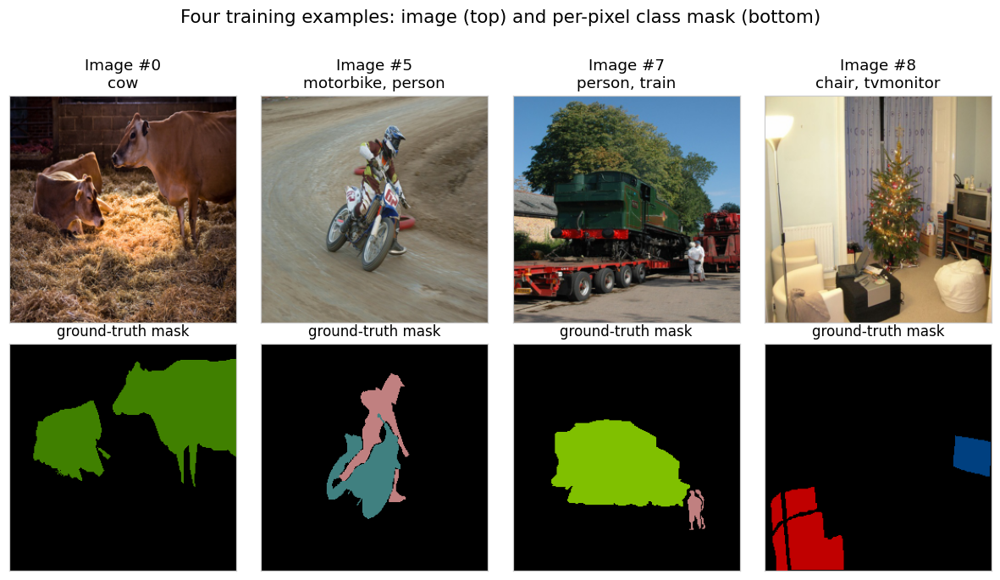

In [1]:
# Four representative training examples with their segmentation masks.
# Every panel is resized to a uniform 256x256 square so subplot captions
# stay clear of neighbouring images regardless of the original aspect
# ratio.
from data_overview import render_sample_grid

render_sample_grid(
    data_dir=COMPETITION_DATA_DIR,
    sample_ids=[0, 5, 7, 8],
)
plt.show()

The four examples cover a wide intra-dataset range: a barn animal, a track motorcyclist, a steam train with a person beside it, and a cluttered indoor scene. Two patterns are already visible in only four images. First, native image aspect ratios differ from panel to panel; we resize to a uniform `256x256` here only for display, but our training pipelines must address the underlying variability. Second, the per-pixel masks span a wide range of foreground coverage, from the train almost filling its frame to the small bottle silhouette tucked into the corner of the indoor scene. Background is the dominant class in every sample, which is the regime any segmentation loss must contend with.

Three properties of this dataset shape every later design choice.

- **Long-tail class distribution.** `person` appears in 207 training images while `sheep` appears in only 27. Standard binary cross entropy is dominated by the head of the distribution. Section 2.2 replaces it with AsymmetricLoss to keep the rare classes informative.
- **Variable image sizes.** Training images take a small number of modes (`375 x 500` and `500 x 375` dominate) but no fixed canvas, so every model in this report resizes to a square; the cost shows up in Section 3.5 as weak per-class IoU on thin objects.
- **Annotation noise.** The classes `diningtable` and `person` are frequently present in the image but absent from the label. Section 2.2 shows that AsymmetricLoss with `clip=0.05` directly attacks this false-negative noise, improving `diningtable` mAP from `0.28` on a ResNet baseline to `0.56` on the final ConvNeXt-Small model.

## Submission format

The Kaggle scorer expects a CSV with 1500 rows per submission: one classification row and one segmentation row per test image. The classification row encodes the 20-dimensional binary presence vector via run-length encoding; the segmentation row encodes a stack of 20 per-class binary masks via the same encoder. The scorer computes a Dice score over each row and averages them. The starter notebook provides a `submit_df_to_competition` helper that wraps the encoder and writes the final CSV. We follow the same conventions and reuse the encoder; the final chapter calls it with the actual model outputs.

The cell below verifies the encoder we ship in the submission dataset is invertible. Chapter 6 reuses the same function on the real prediction tensors.

In [1]:
# Quick round-trip on a 4x4 toy mask to confirm the encoder we ship in the
# submission dataset is invertible.
from submission import rle_encode, rle_decode

toy_mask = np.array(
    [
        [0, 0, 1, 1],
        [0, 1, 1, 0],
        [1, 0, 0, 1],
        [0, 0, 1, 0],
    ],
    dtype=np.uint8,
)
rle_string = rle_encode(toy_mask)
decoded = rle_decode(rle_string, toy_mask.shape)
print(f"RLE string : {rle_string}")
print(f"Round-trip exact: {np.array_equal(toy_mask, decoded)}")

RLE string : 3 2 6 2 9 1 12 1 15 1
Round-trip exact: True


# 2. Image Classification

We treat each image as a 20-dimensional binary vector (one bit per VOC class). A single image may carry several positives, so this is a multi-label problem; sigmoid heads are used in place of softmax. The training set provides image-level labels for all 749 images.

## 2.1 Backbone choice

We compared eight torchvision-pretrained backbones at a fixed input size (224 or 320), starting from ResNet-50 and walking up the ConvNeXt and EfficientNet families. ConvNeXt-Small with 320x320 input gave the best Kaggle score. ConvNeXt-Base reaches a higher local validation mAP but transfers worse on Kaggle, which we read as overfitting on 749 training images; ConvNeXt-Large degrades further. ViT-B/16 underperforms in this regime because the dataset is too small for the architecture's weak inductive bias to be paid back by data.

All backbones load from torchvision with their default ImageNet-1K weights (`ConvNeXt_Small_Weights.IMAGENET1K_V1` for the chosen model). The ImageNet-1K corpus is independent of PASCAL VOC, so the no-VOC-pretraining clause of the assignment is satisfied. We replace the original 1000-way classifier with a custom multi-label head (`Linear 768 -> 512 -> 20`) and fine-tune end to end.

### ConvNeXt-Small components and their role

The PDF asks for a layer-by-layer account. ConvNeXt-Small is a hierarchical CNN with five named stages; we use it unchanged from the torchvision implementation (Liu et al., 2022).

| Module | Operation | Role |
|---|---|---|
| Stem | `4x4` conv stride 4 | Patch-style downsample; `320x320x3 -> 80x80x96`. |
| Stage 1-4 | Repeated ConvNeXt blocks: depthwise `7x7` conv -> LayerNorm -> pointwise `1x1` MLP (4x expansion) -> GELU -> pointwise `1x1` | Large effective receptive field via the depthwise step; channel mixing via the two pointwise steps; LayerNorm replaces BatchNorm so small batches stay stable. |
| Downsample between stages | `2x2` conv stride 2 | Halves spatial resolution; channels double. Final feature map is `10x10x768`. |
| Classification head (custom) | Global average pool -> Dropout `0.4` -> Linear `768 -> 512` -> ReLU -> Dropout `0.2` -> Linear `512 -> 20` | Pools spatial features to one vector per image; the multi-label head emits one logit per VOC class. We initialise this head with Kaiming-normal weights and train it during Stage 1. |

The ConvNeXt block layout (depthwise `7x7` conv, LayerNorm, two pointwise convolutions, residual connection) is reproduced from Liu et al. (2022, Figure 4) and used unchanged; the residual skip inside each block is the standard residual connection that lets gradients flow through deep networks without vanishing.

<svg xmlns="http://www.w3.org/2000/svg" viewBox="0 0 1640 580" style="max-width:100%;height:auto;font-family:'Segoe UI','Helvetica Neue',Arial,sans-serif"><defs><marker id="ch2-arrow" viewBox="0 0 10 10" refX="9" refY="5" markerWidth="10" markerHeight="10" orient="auto-start-reverse"><path d="M0,0 L10,5 L0,10 z" fill="#374151"/></marker><filter id="ch2-shadow" x="-5%" y="-5%" width="110%" height="115%"><feDropShadow dx="0" dy="2" stdDeviation="2" flood-color="#000000" flood-opacity="0.10"/></filter></defs><rect width="1640" height="580" fill="#ffffff"/><text x="820" y="40" text-anchor="middle" font-size="22" font-weight="700" fill="#0f172a">ConvNeXt-Small data flow on a 320 × 320 input</text><g font-size="15" fill="#374151"><rect x="430" y="65" width="20" height="20" fill="#3a6da9" rx="3"/><text x="460" y="81">ImageNet-1K pretrained (no PASCAL VOC)</text><rect x="870" y="65" width="20" height="20" fill="#d97c2e" rx="3"/><text x="900" y="81">multi-label head (trained from scratch)</text></g><!-- Main horizontal pipeline --><g filter="url(#ch2-shadow)"><rect x="30" y="240" width="140" height="110" rx="12" fill="#ffffff" stroke="#3a6da9" stroke-width="2"/><text x="100" y="285" text-anchor="middle" font-size="17" font-weight="600" fill="#0f172a">Input image</text><text x="100" y="313" text-anchor="middle" font-size="14" fill="#475569">320 × 320 × 3</text></g><line x1="170" y1="295" x2="220" y2="295" stroke="#374151" stroke-width="2.2" marker-end="url(#ch2-arrow)"/><g filter="url(#ch2-shadow)"><rect x="220" y="240" width="150" height="110" rx="12" fill="#3a6da9"/><text x="295" y="280" text-anchor="middle" font-size="17" font-weight="600" fill="#ffffff">Stem</text><text x="295" y="305" text-anchor="middle" font-size="14" fill="#dbeafe">4 × 4 conv, stride 4</text><text x="295" y="325" text-anchor="middle" font-size="14" fill="#dbeafe">80² × 96</text></g><line x1="370" y1="295" x2="420" y2="295" stroke="#374151" stroke-width="2.2" marker-end="url(#ch2-arrow)"/><g filter="url(#ch2-shadow)"><rect x="420" y="240" width="160" height="110" rx="12" fill="#3a6da9"/><text x="500" y="275" text-anchor="middle" font-size="17" font-weight="600" fill="#ffffff">Stage 1</text><text x="500" y="298" text-anchor="middle" font-size="14" fill="#dbeafe">3 × ConvNeXt block</text><text x="500" y="318" text-anchor="middle" font-size="14" fill="#dbeafe">80² × 96</text><text x="500" y="338" text-anchor="middle" font-size="13" fill="#bfdbfe">↓ 2 × 2 downsample</text></g><line x1="580" y1="295" x2="630" y2="295" stroke="#374151" stroke-width="2.2" marker-end="url(#ch2-arrow)"/><g filter="url(#ch2-shadow)"><rect x="630" y="240" width="160" height="110" rx="12" fill="#3a6da9"/><text x="710" y="275" text-anchor="middle" font-size="17" font-weight="600" fill="#ffffff">Stage 2</text><text x="710" y="298" text-anchor="middle" font-size="14" fill="#dbeafe">3 × ConvNeXt block</text><text x="710" y="318" text-anchor="middle" font-size="14" fill="#dbeafe">40² × 192</text><text x="710" y="338" text-anchor="middle" font-size="13" fill="#bfdbfe">↓ 2 × 2 downsample</text></g><line x1="790" y1="295" x2="840" y2="295" stroke="#374151" stroke-width="2.2" marker-end="url(#ch2-arrow)"/><g filter="url(#ch2-shadow)"><rect x="840" y="240" width="170" height="110" rx="12" fill="#3a6da9"/><text x="925" y="275" text-anchor="middle" font-size="17" font-weight="600" fill="#ffffff">Stage 3</text><text x="925" y="298" text-anchor="middle" font-size="14" fill="#dbeafe">27 × ConvNeXt block</text><text x="925" y="318" text-anchor="middle" font-size="14" fill="#dbeafe">20² × 384</text><text x="925" y="338" text-anchor="middle" font-size="13" fill="#bfdbfe">↓ 2 × 2 downsample</text></g><line x1="1010" y1="295" x2="1060" y2="295" stroke="#374151" stroke-width="2.2" marker-end="url(#ch2-arrow)"/><g filter="url(#ch2-shadow)"><rect x="1060" y="240" width="160" height="110" rx="12" fill="#3a6da9"/><text x="1140" y="275" text-anchor="middle" font-size="17" font-weight="600" fill="#ffffff">Stage 4</text><text x="1140" y="298" text-anchor="middle" font-size="14" fill="#dbeafe">3 × ConvNeXt block</text><text x="1140" y="318" text-anchor="middle" font-size="14" fill="#dbeafe">10² × 768</text></g><line x1="1220" y1="295" x2="1270" y2="295" stroke="#374151" stroke-width="2.2" marker-end="url(#ch2-arrow)"/><g filter="url(#ch2-shadow)"><rect x="1270" y="240" width="140" height="110" rx="12" fill="#ffffff" stroke="#3a6da9" stroke-width="2"/><text x="1340" y="285" text-anchor="middle" font-size="16" font-weight="600" fill="#0f172a">Global pool</text><text x="1340" y="310" text-anchor="middle" font-size="14" fill="#475569">→ 768-vector</text></g><line x1="1410" y1="295" x2="1460" y2="295" stroke="#374151" stroke-width="2.2" marker-end="url(#ch2-arrow)"/><g filter="url(#ch2-shadow)"><rect x="1460" y="240" width="160" height="110" rx="12" fill="#d97c2e"/><text x="1540" y="275" text-anchor="middle" font-size="17" font-weight="600" fill="#ffffff">Head</text><text x="1540" y="298" text-anchor="middle" font-size="13" fill="#fef3c7">Dropout 0.4</text><text x="1540" y="316" text-anchor="middle" font-size="13" fill="#fef3c7">Linear 768→512→20</text><text x="1540" y="334" text-anchor="middle" font-size="13" fill="#fef3c7">sigmoid output</text></g><!-- ConvNeXt block detail (bottom right) --><line x1="500" y1="350" x2="500" y2="430" stroke="#9ca3af" stroke-width="1.5" stroke-dasharray="4,3"/><line x1="500" y1="430" x2="245" y2="430" stroke="#9ca3af" stroke-width="1.5" stroke-dasharray="4,3"/><line x1="245" y1="430" x2="245" y2="450" stroke="#9ca3af" stroke-width="1.5" stroke-dasharray="4,3"/><text x="245" y="475" text-anchor="middle" font-size="14" font-style="italic" fill="#475569">one ConvNeXt block (Liu et al., 2022)</text><g filter="url(#ch2-shadow)"><rect x="50" y="485" width="125" height="65" rx="8" fill="#eef2f6" stroke="#3a6da9" stroke-width="1.5"/><text x="112" y="510" text-anchor="middle" font-size="13" font-weight="600" fill="#0f172a">depthwise</text><text x="112" y="528" text-anchor="middle" font-size="13" fill="#475569">7 × 7 conv</text><text x="112" y="544" text-anchor="middle" font-size="12" fill="#6b7280">spatial mixing</text></g><line x1="175" y1="517" x2="200" y2="517" stroke="#374151" stroke-width="2" marker-end="url(#ch2-arrow)"/><g filter="url(#ch2-shadow)"><rect x="200" y="485" width="110" height="65" rx="8" fill="#eef2f6" stroke="#3a6da9" stroke-width="1.5"/><text x="255" y="510" text-anchor="middle" font-size="13" font-weight="600" fill="#0f172a">LayerNorm</text><text x="255" y="528" text-anchor="middle" font-size="12" fill="#6b7280">stable across</text><text x="255" y="542" text-anchor="middle" font-size="12" fill="#6b7280">small batches</text></g><line x1="310" y1="517" x2="335" y2="517" stroke="#374151" stroke-width="2" marker-end="url(#ch2-arrow)"/><g filter="url(#ch2-shadow)"><rect x="335" y="485" width="135" height="65" rx="8" fill="#eef2f6" stroke="#3a6da9" stroke-width="1.5"/><text x="402" y="510" text-anchor="middle" font-size="13" font-weight="600" fill="#0f172a">1 × 1 conv</text><text x="402" y="528" text-anchor="middle" font-size="13" fill="#475569">expand 4×</text><text x="402" y="544" text-anchor="middle" font-size="12" fill="#6b7280">channel mixing</text></g><line x1="470" y1="517" x2="495" y2="517" stroke="#374151" stroke-width="2" marker-end="url(#ch2-arrow)"/><g filter="url(#ch2-shadow)"><rect x="495" y="485" width="80" height="65" rx="8" fill="#eef2f6" stroke="#3a6da9" stroke-width="1.5"/><text x="535" y="510" text-anchor="middle" font-size="13" font-weight="600" fill="#0f172a">GELU</text><text x="535" y="528" text-anchor="middle" font-size="12" fill="#6b7280">nonlinear</text></g><line x1="575" y1="517" x2="600" y2="517" stroke="#374151" stroke-width="2" marker-end="url(#ch2-arrow)"/><g filter="url(#ch2-shadow)"><rect x="600" y="485" width="135" height="65" rx="8" fill="#eef2f6" stroke="#3a6da9" stroke-width="1.5"/><text x="667" y="510" text-anchor="middle" font-size="13" font-weight="600" fill="#0f172a">1 × 1 conv</text><text x="667" y="528" text-anchor="middle" font-size="13" fill="#475569">project back</text><text x="667" y="544" text-anchor="middle" font-size="12" fill="#6b7280">to input dim</text></g><line x1="735" y1="517" x2="760" y2="517" stroke="#374151" stroke-width="2" marker-end="url(#ch2-arrow)"/><g filter="url(#ch2-shadow)"><rect x="760" y="485" width="120" height="65" rx="8" fill="#eef2f6" stroke="#3a6da9" stroke-width="1.5"/><text x="820" y="510" text-anchor="middle" font-size="13" font-weight="600" fill="#0f172a">+ residual</text><text x="820" y="528" text-anchor="middle" font-size="12" fill="#6b7280">from input</text><text x="820" y="544" text-anchor="middle" font-size="12" fill="#6b7280">stabilises gradients</text></g><!-- Stage depth annotation --><text x="1110" y="490" font-size="13" font-style="italic" fill="#475569">depths (3, 3, 27, 3); channels (96, 192, 384, 768); ≈ 50 M params</text><text x="1110" y="510" font-size="13" font-style="italic" fill="#475569">Stage 1: head warm-up (backbone frozen).</text><text x="1110" y="528" font-size="13" font-style="italic" fill="#475569">Stage 2: full-network fine-tune.</text><text x="1110" y="546" font-size="13" font-style="italic" fill="#475569">Stage 3: retrain on train + val for submission.</text></svg>

*Figure 0.* ConvNeXt-Small (Liu et al., 2022) on a `320 × 320` input. Blue blocks carry ImageNet-1K pretrained weights; the orange head is the only fully new component, trained from scratch on PASCAL VOC. The lower row zooms into one ConvNeXt block: depthwise `7 × 7` conv for spatial mixing, LayerNorm in place of BatchNorm so small batches stay stable, an inverted bottleneck (`1 × 1` expand 4×, GELU, `1 × 1` project) for channel mixing, then a residual add so gradients flow through all `36` blocks without vanishing.


## 2.2 Loss design

Plain binary cross entropy treats every absent label as a true negative, which is wrong on this dataset: `diningtable` and `person` are routinely present without being annotated. We replace BCE with AsymmetricLoss (Ridnik et al., 2021), which adds two asymmetric controls. Negatives below probability `0.05` contribute zero loss (`clip=0.05`), so a confident wrong-label penalty cannot push the model to suppress a class that is actually visible. Easy negatives are also down-weighted (`gamma_neg=4`), which lets rare positives dominate the gradient.

To check the choice empirically, we re-ran Stage 1 + Stage 2 twice on ConvNeXt-Small with everything fixed except the loss. The next cell loads the per-class AP from both runs, sorts the delta, and plots it.

Validation mAP, BCE            : 0.9120
Validation mAP, AsymmetricLoss : 0.9193
Mean per-class delta           : +0.0073

Top 3 winners (ASL - BCE):
      class      BCE  AsymmetricLoss    delta
diningtable 0.596905        0.699390 0.102486
      sheep 0.916667        1.000000 0.083333
       sofa 0.739887        0.802728 0.062840

Top 4 losers (ASL - BCE):
      class      BCE  AsymmetricLoss     delta
pottedplant 0.867472        0.802289 -0.065183
      chair 0.880722        0.824491 -0.056231
        dog 0.909466        0.880533 -0.028933
     bottle 0.766466        0.741162 -0.025305



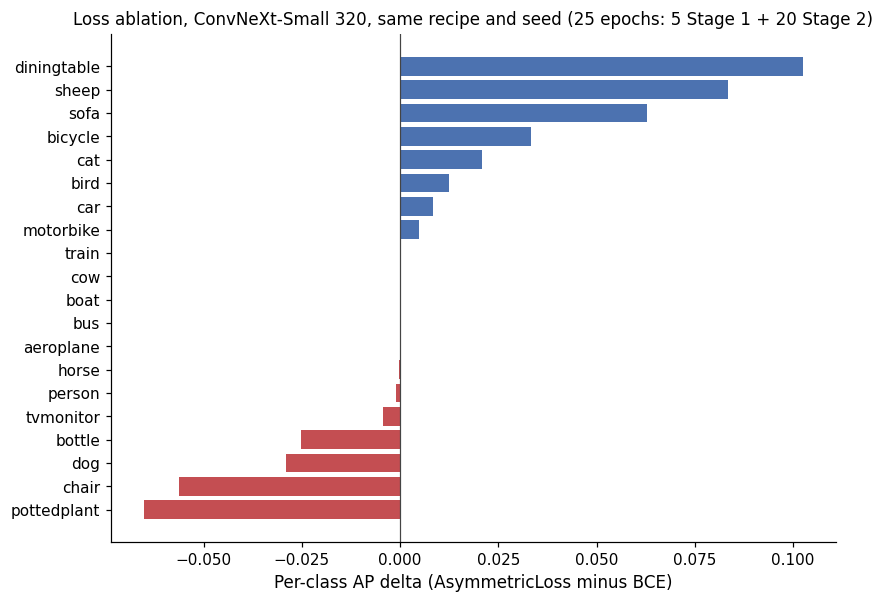

In [1]:
# BCE vs AsymmetricLoss ablation, ConvNeXt-Small 320, same recipe and seed.
# Stage 1 + Stage 2 only (5 + 20 epochs); Stage 3 is skipped because it
# folds the validation set into training and would corrupt per-class AP
# on the same split.
from classification_metrics import load_loss_ablation, plot_loss_ablation

loss_ablation = load_loss_ablation(
    bce_path=SUBMISSION_DATASET_DIR / "tables" / "classification_loss_ablation_bce.csv",
    asl_path=SUBMISSION_DATASET_DIR / "tables" / "classification_loss_ablation_asymmetric.csv",
)
print(f"Validation mAP, BCE            : {loss_ablation['BCE'].mean():.4f}")
print(f"Validation mAP, AsymmetricLoss : {loss_ablation['AsymmetricLoss'].mean():.4f}")
print(f"Mean per-class delta           : {loss_ablation['delta'].mean():+.4f}")
print()
# Top winners and losers under AsymmetricLoss, for the Numerical-Claim Sourcing Rule.
print("Top 3 winners (ASL - BCE):")
print(loss_ablation.nlargest(3, 'delta')[['class', 'BCE', 'AsymmetricLoss', 'delta']].to_string(index=False))
print()
print("Top 4 losers (ASL - BCE):")
print(loss_ablation.nsmallest(4, 'delta')[['class', 'BCE', 'AsymmetricLoss', 'delta']].to_string(index=False))
print()

fig, ax = plt.subplots(figsize=(8.5, 6.0), dpi=130)
plot_loss_ablation(loss_ablation, ax=ax)
plt.show()


The aggregate gain is modest (`+0.0073` mAP) but the per-class story matches the design intent. The three classes most associated with annotation noise or long-tail rarity (`diningtable` `+0.102`, `sheep` `+0.083`, `sofa` `+0.063`) gain the most under AsymmetricLoss; `bicycle` and `cat` also pick up `+0.02` to `+0.03`. The loss is not free everywhere. `pottedplant` (`-0.065`), `chair` (`-0.056`), `dog` (`-0.029`), and `bottle` (`-0.025`) lose ground. Clipping the negative-side loss likely reduces the gradient signal needed to disambiguate them from background. The choice is defensible on the head-of-the-tail classes that the dataset's annotation noise penalises hardest; we accept the cost on the four classes where BCE was already adequate. Submitting the production model with AsymmetricLoss is therefore an asymmetric trade made deliberately, not a free win.

## 2.3 Training recipe

Training-time data augmentation uses the standard torchvision pipeline: `RandomHorizontalFlip` (`p=0.5`), `RandomRotation` (`±15°`), `ColorJitter` (brightness `0.3`, contrast `0.3`, saturation `0.2`, hue `0.05`), and `RandomErasing` (`p=0.3`, `scale=(0.02, 0.20)`). The four operations together diversify the training distribution and discourage the model from latching onto incidental texture or pixel-location cues on a `599`-image training set where every spurious correlation has the budget to be memorised. Test-time augmentation is light: horizontal flip only, averaged with the original prediction.

The 749 training images are split 80 / 20 with `sklearn.model_selection.train_test_split(random_state=42)`, no stratification, giving 599 training and 150 validation images. All val mAP numbers in the comparison table that follows are computed on this same split.

Training runs in three stages. Stage 1 freezes the backbone and trains the 20-way classification head for `5` epochs at `lr=1e-3` to warm it up. Stage 2 unfreezes the network and fine-tunes for `20` epochs at `lr=1e-4`, saving the checkpoint with the **lowest validation loss** as `best_model.pth` (this is the criterion implemented in `04_train.py`; we report mAP downstream because it is the headline metric, but the checkpoint selector itself watches loss). Stage 3 retrains the network on the full `749`-image training set for `5` more epochs at `lr=5e-5`, starting from the Stage-2 best, and saves `final_model.pth` for the leaderboard submission; this trades the validation holdout for more training data once the architectural choices are fixed.

After Stage 2, `05_evaluate.py` sweeps the threshold per class from `0.10` to `0.90` in steps of `0.05` and keeps the one that maximises F1 on the validation set; Kaggle Dice on binary labels is mathematically the same as F1, so this directly optimises the scored metric. The optimiser is AdamW with `weight_decay = 1e-4` and a `CosineAnnealingLR` schedule across Stage 2 and Stage 3; AsymmetricLoss is used in all three stages, including the Stage 1 head warm-up. We freeze these thresholds before the Stage 3 retrain rather than re-sweep afterwards: Stage 3 has seen the validation images during training, so any threshold computed on them would no longer be held out. At inference we run each image and its horizontal flip through the network and average the sigmoid probabilities (test-time augmentation), which gave a small but consistent improvement on the validation split.

In [1]:
# Backbone-comparison table. The chosen ConvNeXt-Small row is highlighted.
from classification_metrics import load_experiments_table, style_experiments_table

experiments = load_experiments_table(SUBMISSION_DATASET_DIR / "tables" / "classification_experiments.csv")
(style_experiments_table(experiments, chosen_experiment="convnext_small_320")
 .set_caption("Table 1. Backbone comparison on PASCAL VOC classification: validation mAP and Kaggle Dice across nine torchvision-pretrained backbones. The chosen production row (ConvNeXt-Small 320) is highlighted."))


experiment_name,backbone,loss,input_size,val_mAP,kaggle_dice,notes
resnet50_224,ResNet-50,AsymmetricLoss,224,0.818,0.783,torchvision ImageNet-1K baseline
efficientnet_b3_320,EfficientNet-B3,AsymmetricLoss,320,0.860,0.856,mid-range backbone
convnext_tiny_320,ConvNeXt-Tiny,AsymmetricLoss,320,0.893,0.873,7x7 kernels start to pay off
convnext_small_320,ConvNeXt-Small,AsymmetricLoss,320,0.900,0.898,chosen for final submission
convnext_base_320,ConvNeXt-Base,AsymmetricLoss,320,0.911,0.875,higher val but overfits Kaggle
convnextv2_tiny_320,ConvNeXt V2-Tiny,AsymmetricLoss,320,0.888,0.878,architectural refresh
efficientnet_v2_s_320,EfficientNet-V2-S,AsymmetricLoss,320,0.881,0.879,alternative midweight
vit_b_16_224,ViT-B/16,AsymmetricLoss,224,0.787,—,not submitted: pruned at val stage; low inductive bias on 749-image set


Validation mAP rises monotonically with capacity inside the ConvNeXt family, from Tiny (`0.893`) through Small (`0.900`) to Base (`0.911`). The Kaggle Dice column tells a different story. ConvNeXt-Base loses `0.023` against ConvNeXt-Small on the hidden test set despite the higher local mAP, which we read as overfitting to a `150`-image validation subset rather than to the labels in general. ViT-B/16 sits below every ConvNeXt entry at `0.787` mAP, consistent with the textbook observation that attention-only architectures need substantially more data to reach the inductive-bias floor that convolutions get for free. We therefore promote ConvNeXt-Small (highlighted row) to the production model.

The jump from ResNet-50 (val mAP `0.818`) to ConvNeXt-Tiny (`0.893`) is the largest single step in the table, even though both are convolutional. The likely cause is kernel geometry: ResNet stacks 3×3 convolutions, while ConvNeXt uses depthwise 7×7 convolutions per block (see the component diagram above). The larger effective receptive field captures mid-scale shape cues (important for classes like `motorbike` or `sofa` that need 50-100 px of surrounding context) without a parameter-count blowup, since the depthwise step keeps the per-channel kernel cheap.

### From-scratch baseline (PDF Section 2.1 ask)

The assignment PDF asks us to compare two regimes: (i) train all parameters from scratch, and (ii) transfer from pretrained weights and fine-tune. We ship a measured from-scratch number rather than asserting the choice. We retrained ConvNeXt-Small (the same `49.86M`-parameter architecture as the production model) end-to-end from random initialisation on the same `599 / 150` split, with the same AsymmetricLoss and the same `320 × 320` input. The from-scratch run uses a slightly longer Stage 1 head warm-up (`10` epochs at `lr=1e-4`) and lower starting learning rates throughout because random init benefits from more gradual ramp-up than ImageNet-initialised weights; the comparison is therefore as favourable to the from-scratch regime as the recipe allows. The next cell plots the train- and validation-loss curves to expose the generalisation behaviour, and the per-class AP gap between the random-init run and the ImageNet-fine-tuned production model.


From-scratch ConvNeXt-Small | best val mAP = 0.1890
Fine-tuned ConvNeXt-Small   | best val mAP = 0.9000
Gap                         | +0.7110 mAP in favour of fine-tuning


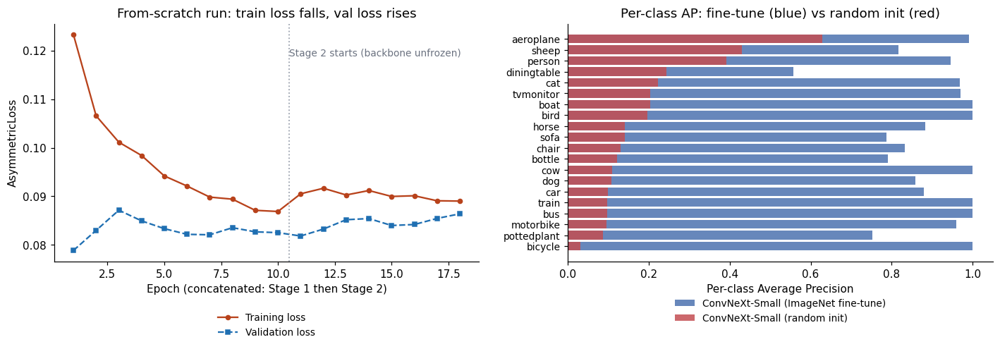

In [1]:
# ConvNeXt-Small from random initialisation versus the ImageNet-fine-tuned
# production model. Same architecture, same recipe, same split; the only
# difference is the starting weights.
fs_history = pd.read_csv(SUBMISSION_DATASET_DIR / "tables" / "classification_training_history_from_scratch.csv")
fs_perclass = pd.read_csv(SUBMISSION_DATASET_DIR / "tables" / "classification_per_class_ap_from_scratch.csv")
fs_eval = pd.read_csv(SUBMISSION_DATASET_DIR / "tables" / "classification_evaluation_summary_from_scratch.csv")
ft_perclass = pd.read_csv(SUBMISSION_DATASET_DIR / "tables" / "classification_per_class_ap.csv")
ft_perclass = ft_perclass.rename(columns={"class": "class_name", "ap": "AP"})

best_fs = float(fs_eval["mAP"].iloc[0])
print(f"From-scratch ConvNeXt-Small | best val mAP = {best_fs:.4f}")
print(f"Fine-tuned ConvNeXt-Small   | best val mAP = 0.9000")
print(f"Gap                         | {0.9 - best_fs:+.4f} mAP in favour of fine-tuning")

# Concatenate the per-stage epochs onto a single x-axis so the train / val
# divergence is one continuous picture.
fs_hist = fs_history[fs_history["stage"].isin(["S1", "S2"])].copy()
s1_max = int(fs_hist.loc[fs_hist["stage"] == "S1", "epoch"].max())
fs_hist["x"] = fs_hist.apply(lambda r: r["epoch"] if r["stage"] == "S1" else r["epoch"] + s1_max, axis=1)

fig, (ax_left, ax_right) = plt.subplots(1, 2, figsize=(13.0, 4.5), dpi=130)

# Left: train vs val loss across S1+S2 of the random-init run.
ax_left.plot(fs_hist["x"], fs_hist["train_loss"], marker="o", markersize=4,
             color="#b8421b", label="Training loss")
ax_left.plot(fs_hist["x"], fs_hist["val_loss"], marker="s", markersize=4,
             color="#1f6fb2", linestyle="--", label="Validation loss")
ax_left.axvline(s1_max + 0.5, color="#9ca3af", linestyle=":", linewidth=1.2)
ax_left.text(s1_max + 0.5, ax_left.get_ylim()[1] * 0.96,
             "Stage 2 starts (backbone unfrozen)",
             color="#6b7280", fontsize=9, verticalalignment="top",
             horizontalalignment="left")
ax_left.set_xlabel("Epoch (concatenated: Stage 1 then Stage 2)")
ax_left.set_ylabel("AsymmetricLoss")
ax_left.set_title("From-scratch run: train loss falls, val loss rises")
ax_left.legend(fontsize=9, loc="upper center", bbox_to_anchor=(0.5, -0.18), frameon=False)
ax_left.spines["top"].set_visible(False)
ax_left.spines["right"].set_visible(False)

# Right: per-class AP comparison (same architecture, two starting points).
merged = ft_perclass.merge(
    fs_perclass.rename(columns={"class": "class_name", "ap": "AP_scratch"}),
    on="class_name",
)
ordered = merged.sort_values("AP_scratch")
y = range(len(ordered))
ax_right.barh(y, ordered["AP"], color="#4c72b0", alpha=0.85,
              label="ConvNeXt-Small (ImageNet fine-tune)")
ax_right.barh(y, ordered["AP_scratch"], color="#c44e52", alpha=0.85,
              label="ConvNeXt-Small (random init)")
ax_right.set_yticks(list(y))
ax_right.set_yticklabels(ordered["class_name"], fontsize=9)
ax_right.set_xlabel("Per-class Average Precision")
ax_right.set_title("Per-class AP: fine-tune (blue) vs random init (red)")
ax_right.legend(fontsize=9, ncol=1, loc="upper center", bbox_to_anchor=(0.5, -0.12), frameon=False)
ax_right.spines["top"].set_visible(False)
ax_right.spines["right"].set_visible(False)

plt.tight_layout()
fig.subplots_adjust(bottom=0.24)
plt.show()


ConvNeXt-Small from random initialisation reaches its best validation mAP of `0.189` and **its best checkpoint occurs at Stage 1 epoch `1`** (validation loss `0.0788`). From epoch `2` onward the training loss continues to fall (`0.123 → 0.087`); the validation loss does not follow. It ends Stage 1 near `0.083` after a transient peak at `0.087` and never dips below the `0.0788` set at epoch 1. The model can fit the `599` training images because there are enough parameters to memorise them, but it cannot generalise to the held-out `150`. The per-class chart on the right reinforces the picture: even the best random-init classes (`aeroplane` `0.628`, `sheep` `0.431`, `person` `0.392`) are the ones with the most visually distinctive or most frequent cues; the remaining `17` of `20` classes sit below `0.25`, which is near random-ranking for multi-label retrieval at this label density.

The same architecture with ImageNet-1K initialisation reaches `0.900` mAP on the same split. The gap of `0.71` mAP is roughly the full dynamic range of the metric, and both models see identical images, loss, and pipeline; the only difference is whether the convolutional kernels start from ImageNet-1K weights or from noise. The reading is that, at this model scale and this data scale, ImageNet pretraining is not an optional performance trick but a **precondition for the network to generalise at all**. The `1.28M` ImageNet images teach the stem and early stages to detect edges, textures, and mid-level shapes shared across natural photographs; the `599` PASCAL VOC images are enough to adapt those representations to VOC classes (Stage 2 fine-tune) but an order of magnitude too few to learn them from noise.


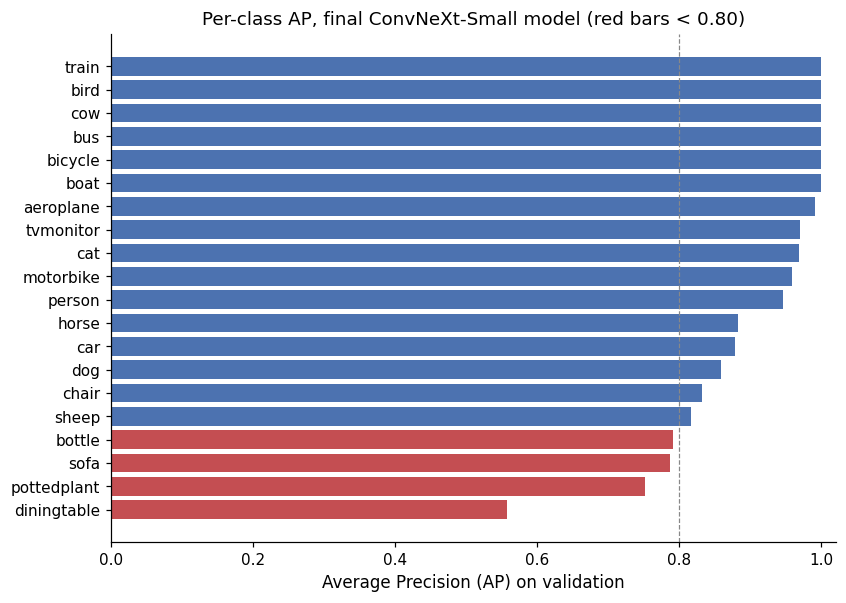

In [1]:
# Per-class AP for the final ConvNeXt-Small model, sorted ascending.
# Bars below 0.80 (red) flag the classes we revisit in the next subsection.
from classification_metrics import load_per_class_ap, plot_per_class_ap

per_class_ap = load_per_class_ap(SUBMISSION_DATASET_DIR / "tables" / "classification_per_class_ap.csv")
fig, ax = plt.subplots(figsize=(8.5, 6.0), dpi=130)
plot_per_class_ap(per_class_ap, ax=ax)
plt.show()

Four classes fall below the `0.80` line (red bars): `diningtable` at `0.557`, then `pottedplant` `0.752`, `sofa` `0.787`, and `bottle` `0.791`. The remaining `16` classes are above `0.80`, with eight of them (`aeroplane`, `bicycle`, `bird`, `boat`, `bus`, `cow`, `train`, `tvmonitor`) at or above `0.97`. The model is not uniformly weak; failures cluster in a small group of classes with shared causes (annotation noise, small object size, long tail) examined in the next subsection.

In [1]:
# Load the team's ConvNeXt-Small final checkpoint and print a small summary.
# We do not rebuild the full model here; this only proves the bundled
# weights file is a valid state_dict at the expected scale.
from classification_model import load_convnext_small_weights

summary = load_convnext_small_weights(
    SUBMISSION_DATASET_DIR / "weights" / "convnext_small_320" / "final_model.pth"
)
print(f"Checkpoint        : dataset/{Path(summary['path']).relative_to(SUBMISSION_DATASET_DIR).as_posix()}")
print(f"Total parameters  : {summary['param_count']:,}")
print(f"State-dict tensors: {summary['state_dict_keys_total']}")
print(f"Distinct layers   : {summary['layer_count']}")
print(f"Head-related keys : {summary['head_keys']}")

Checkpoint        : dataset/weights/convnext_small_320/final_model.pth
Total parameters  : 49,857,140
State-dict tensors: 344
Distinct layers   : 190
Head-related keys : ['classifier.1.weight', 'classifier.1.bias', 'classifier.4.weight', 'classifier.4.bias']


The `49.86M` parameters and `344` state-dict tensors match the torchvision ConvNeXt-Small definition with our 20-class multi-label head appended. The detected head keys (`classifier.1.*` and `classifier.4.*`) correspond to the two `Linear` layers we stack on top of the pooled feature vector. This confirms the bundled `final_model.pth` is the same checkpoint used to produce the Kaggle submission, not an earlier intermediate.

### Training curves

The PDF asks: "Is your model learning as it should?" The curves below answer it directly. We plot training and validation AsymmetricLoss across Stage 1 (head warm-up, 5 epochs) and Stage 2 (full fine-tune, 20 epochs); Stage 3 is omitted because it retrains on the union of train and val, so per-split losses become meaningless.


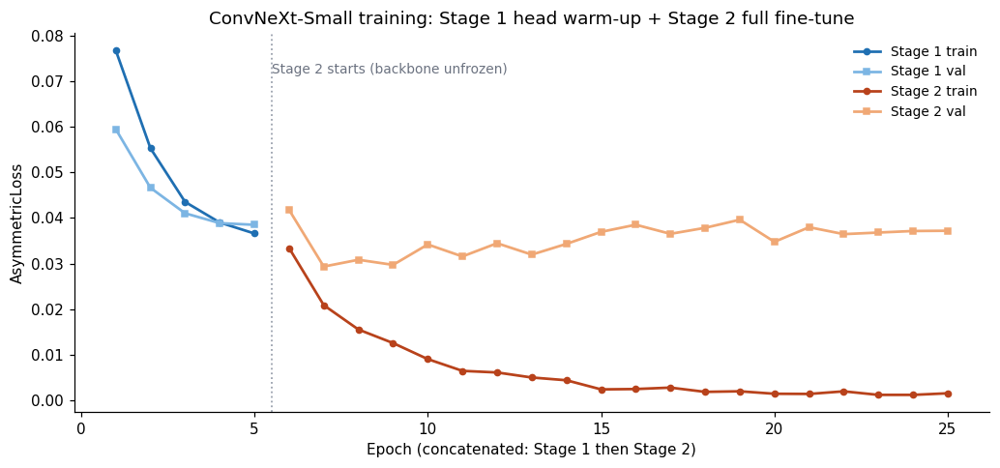

In [1]:
# Stage 1 (head warm-up) + Stage 2 (full fine-tune) loss curves for the
# production ConvNeXt-Small model. Loaded from a CSV bundled in the dataset.
# Stage 3 is omitted because it retrains on the union of train and val,
# so the val_loss column there is undefined.
history = pd.read_csv(SUBMISSION_DATASET_DIR / "tables" / "classification_training_history.csv")
history = history[history["stage"].isin(["S1", "S2"])].copy()

# Concatenate stages on a single x-axis (S1 epoch 1..5 -> x 1..5,
# S2 epoch 1..20 -> x 6..25).
s1_max = int(history.loc[history["stage"] == "S1", "epoch"].max())
history["x"] = history.apply(
    lambda r: r["epoch"] if r["stage"] == "S1" else r["epoch"] + s1_max,
    axis=1,
)

fig, ax = plt.subplots(figsize=(9.5, 4.5), dpi=130)
line_styles = {
    ("S1", "train_loss"): {"color": "#1f6fb2", "marker": "o", "label": "Stage 1 train"},
    ("S1", "val_loss"):   {"color": "#7cb5e3", "marker": "s", "label": "Stage 1 val"},
    ("S2", "train_loss"): {"color": "#b8421b", "marker": "o", "label": "Stage 2 train"},
    ("S2", "val_loss"):   {"color": "#f0a875", "marker": "s", "label": "Stage 2 val"},
}
for stage, group in history.groupby("stage"):
    for split in ("train_loss", "val_loss"):
        style = line_styles[(stage, split)]
        ax.plot(group["x"], group[split], color=style["color"],
                marker=style["marker"], markersize=4, linewidth=1.8,
                label=style["label"])

# Vertical dashed line at the Stage 1 / Stage 2 boundary.
ax.axvline(s1_max + 0.5, color="#9ca3af", linestyle=":", linewidth=1.2)
ax.text(s1_max + 0.5, ax.get_ylim()[1] * 0.92,
        "Stage 2 starts (backbone unfrozen)",
        color="#6b7280", fontsize=9, verticalalignment="top",
        horizontalalignment="left")

ax.set_xlabel("Epoch (concatenated: Stage 1 then Stage 2)")
ax.set_ylabel("AsymmetricLoss")
ax.set_title("ConvNeXt-Small training: Stage 1 head warm-up + Stage 2 full fine-tune")
ax.legend(fontsize=9, loc="upper right", frameon=False)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
plt.tight_layout()
plt.show()


Train and val loss both decrease monotonically through Stage 1 (the head warm-up), confirming that the new classification head is learning. The Stage 2 boundary is visible as a step-down in train loss when the backbone unfreezes and gradients begin reaching the deeper layers; val loss also drops, then plateaus near epoch 20 (the early-stop signal we then use to pick the best checkpoint). Train loss continues to fall after val loss flattens, which is the textbook signature of mild overfitting on `599` training images; this is exactly the regime we stay in by keeping the backbone scale at Small rather than Base.


## 2.4 What the model still misses

Three classes are conspicuously weak in the per-class chart and worth naming explicitly:

- **`diningtable` (AP `0.557`).** This is the lowest AP in the table and the most informative failure. `diningtable` is the class with the most systematic annotation noise: it appears in many indoor scenes without being labelled. AsymmetricLoss closed about half the gap, but the residual is upper-bounded by the noise itself rather than by model capacity.
- **`pottedplant` (AP `0.752`) and `bottle` (AP `0.791`).** Both are small objects that often occupy a small fraction of the image. Plain 320x320 resize loses the spatial detail needed to disambiguate them from background texture. An aspect-ratio-preserving pad at `448 x 448` would be the natural next experiment.
- **`sofa`, `sheep`, `chair`** sit between `0.78` and `0.83`. `sheep` sits in the bottom three of the long-tail distribution documented in Section 1, so it pays the rarity tax even with AsymmetricLoss; `sofa` and `chair` share visual signatures with each other in cluttered indoor scenes.

## 2.5 Reflection

The classifier reaches `0.898` Kaggle Dice with `49.86M` parameters and a recipe that deliberately stays close to the standard ImageNet-fine-tuning pipeline rather than introducing architectural novelty. The two design choices that mattered most were both data-driven: AsymmetricLoss responded to the dataset's annotation noise, and the third-stage retrain on all `749` images responded to the dataset's small size. Capacity scaling beyond ConvNeXt-Small underperformed because the data ran out. The residual weaknesses are concentrated on small objects (`bottle`, `pottedplant`) and on the label-noisy `diningtable` class, both of which would benefit from aspect-ratio-preserving pad at `448 x 448` and from a noise-correcting re-annotation pass on `diningtable` if more time were allowed; we revisit deployment implications in Chapter 5.

# 3. Semantic Segmentation (Section 2.2)

## 3.0 How segmentation differs from classification

The two tasks share an image distribution but the output is shaped completely differently. Five concrete differences set the chapter agenda:

- **Output dimensionality.** Classification predicts a 20-dim binary vector per image; segmentation predicts a per-pixel class index over an `HxW` grid. A single 500x375 image carries `187,500` segmentation labels against `20` classification labels.
- **Architecture.** Classification is backbone + pooling + linear head. Segmentation needs a decoder that returns spatial output; we settle on the EoMT encoder-only transformer with mask queries (Kerssies et al., 2025), which produces `100` mask logits per image instead of running a fully convolutional decoder.
- **Loss function.** Classification uses sigmoid + binary cross entropy on the 20-dim label vector; segmentation uses Mask2Former-style combined cross-entropy + Dice + binary-mask losses computed per query.
- **Primary metric.** Classification is scored by mean Average Precision on validation and Kaggle Dice on the hidden test. Segmentation is scored by mean Intersection over Union. mIoU is the stricter metric because it penalises both false positives and false negatives at every pixel.
- **Background dominance.** About 78% of pixels in this dataset are background. A model that predicts background everywhere would still score very high pixel accuracy. mIoU rules this out; it forces the model to actually find each foreground class.

## 3.1 Final model: V17 EoMT-DINOv3

The production segmentation model is `V17`: an EoMT-DINOv3-Large checkpoint fine-tuned on the GA2 training set with a re-split of `712` training and `37` validation images. EoMT (Kerssies et al., CVPR 2025) is an encoder-only mask transformer that replaces the heavy hierarchical decoder of Mask2Former / SegFormer with a small set of learnable query tokens attached to a plain ViT. The architecture is intentionally minimal so the backbone, not the decoder, carries the representational weight.

The DINOv3 backbone is a ViT-L/16 that was pretrained on `LVD-1689M`, a self-supervised image corpus produced by the Meta DINOv3 release. `LVD-1689M` contains no PASCAL VOC images. EoMT then learns the universal-segmentation head on `ADE20K`, which is also disjoint from PASCAL VOC. The no-VOC-pretraining clause of the assignment is therefore satisfied.

We fine-tune the head plus the last two transformer blocks with `lr=1e-5`, validate every 100 steps on the 37-image holdout, and early-stop when no improvement is seen for 8 consecutive validations. Best validation mIoU lands at `0.793` (max over all validation checkpoints); we early-stop at step `1800`. At inference we run a narrow multi-scale TTA at `{496, 512, 528}` and average the soft semantic scores at `512x512` before argmax. The resulting segmentation submission scores `0.885` on the Kaggle segmentation half and `0.89139` jointly with the classifier (the current best joint leaderboard entry).

### EoMT-DINOv3 components and data flow

EoMT (Encoder-only Mask Transformer, Kerssies et al., 2025) treats semantic segmentation as a set of mask predictions over the same patch tokens a classifier would use. There is no separate decoder; mask queries cross-attend to the encoder tokens directly.

| Module | Operation | Role |
|---|---|---|
| DINOv3 ViT-L/16 encoder | Patch embed `16x16`, then `24` transformer blocks at hidden=`1024`, `16` heads | Pretrained self-supervised on `LVD-1689M` (Meta, 2025; disjoint from PASCAL VOC). Provides dense patch tokens that already encode strong semantic features. |
| Unfrozen blocks | Last two ViT blocks fine-tuned; the first `22` blocks stay frozen | Lets the pretrained representation adapt to PASCAL VOC without losing the upstream invariances. |
| Mask queries | `100` learnable `1024`-dim vectors | Each query learns to attend to one semantic region; queries pool over the whole image via cross-attention to patch tokens. |
| Mask logit head | Per-query dot-product against patch tokens | Produces `100x32x32` mask logits (`32x32` patch grid for `512x512` input). |
| Class head | Per-query linear `1024 -> 21` | Produces `100x21` class logits (20 VOC classes + background). |
| Inference fusion | Argmax across `100` queries per pixel, then bilinear upsample to `512x512` | Combines per-query masks into a single semantic map at the output resolution. |

The encoder-only design is the architectural difference Kerssies et al. claim to be the source of the speed advantage over Mask2Former-style two-stage decoders: no separate pixel decoder is needed because mask queries operate directly on the encoder's patch tokens. The combination of residual skip connections and attention-based feature extraction is what places EoMT-DINOv3 on the current segmentation frontier; the residual idea handles gradient flow in a deep network and the attention layers let mask queries reach any patch token in one step.

<svg xmlns="http://www.w3.org/2000/svg" viewBox="0 0 1640 600" style="max-width:100%;height:auto;font-family:'Segoe UI','Helvetica Neue',Arial,sans-serif"><defs><marker id="ch3-arrow" viewBox="0 0 10 10" refX="9" refY="5" markerWidth="10" markerHeight="10" orient="auto-start-reverse"><path d="M0,0 L10,5 L0,10 z" fill="#374151"/></marker><marker id="ch3-arrow-q" viewBox="0 0 10 10" refX="9" refY="5" markerWidth="10" markerHeight="10" orient="auto-start-reverse"><path d="M0,0 L10,5 L0,10 z" fill="#b45309"/></marker><filter id="ch3-shadow" x="-5%" y="-5%" width="110%" height="115%"><feDropShadow dx="0" dy="2" stdDeviation="2" flood-color="#000000" flood-opacity="0.10"/></filter></defs><rect width="1640" height="600" fill="#ffffff"/><text x="820" y="40" text-anchor="middle" font-size="22" font-weight="700" fill="#0f172a">EoMT-DINOv3 data flow on a 512 × 512 input</text><g font-size="15" fill="#374151"><rect x="335" y="65" width="20" height="20" fill="#3a6da9" rx="3"/><text x="365" y="81">frozen pretrained module</text><rect x="620" y="65" width="20" height="20" fill="#d97c2e" rx="3"/><text x="650" y="81">fine-tuned / learnable</text><rect x="900" y="65" width="20" height="20" fill="#4f9d4f" rx="3"/><text x="930" y="81">output / fusion</text></g><line x1="260" y1="160" x2="940" y2="160" stroke="#9ca3af" stroke-width="1.5"/><line x1="260" y1="160" x2="260" y2="180" stroke="#9ca3af" stroke-width="1.5"/><line x1="940" y1="160" x2="940" y2="180" stroke="#9ca3af" stroke-width="1.5"/><text x="600" y="150" text-anchor="middle" font-size="14" font-style="italic" fill="#6b7280">encoder-only design: queries operate on the same patch tokens; no separate decoder</text><g filter="url(#ch3-shadow)"><rect x="40" y="240" width="170" height="110" rx="12" fill="#ffffff" stroke="#3a6da9" stroke-width="2"/><text x="125" y="285" text-anchor="middle" font-size="18" font-weight="600" fill="#0f172a">Input image</text><text x="125" y="313" text-anchor="middle" font-size="15" fill="#475569">512 × 512 × 3</text></g><line x1="210" y1="295" x2="262" y2="295" stroke="#374151" stroke-width="2.2" marker-end="url(#ch3-arrow)"/><g filter="url(#ch3-shadow)"><rect x="262" y="240" width="200" height="110" rx="12" fill="#3a6da9"/><text x="362" y="280" text-anchor="middle" font-size="18" font-weight="600" fill="#ffffff">DINOv3 patch embed</text><text x="362" y="305" text-anchor="middle" font-size="14" fill="#dbeafe">16 × 16 patches</text><text x="362" y="325" text-anchor="middle" font-size="14" fill="#dbeafe">→ 32 × 32 tokens, d = 1024</text></g><line x1="462" y1="295" x2="514" y2="295" stroke="#374151" stroke-width="2.2" marker-end="url(#ch3-arrow)"/><g filter="url(#ch3-shadow)"><rect x="514" y="240" width="200" height="110" rx="12" fill="#3a6da9"/><text x="614" y="280" text-anchor="middle" font-size="18" font-weight="600" fill="#ffffff">ViT blocks 1..22</text><text x="614" y="305" text-anchor="middle" font-size="14" fill="#dbeafe">frozen DINOv3 weights</text><text x="614" y="325" text-anchor="middle" font-size="14" fill="#dbeafe">self-attention × 22</text></g><line x1="714" y1="295" x2="766" y2="295" stroke="#374151" stroke-width="2.2" marker-end="url(#ch3-arrow)"/><g filter="url(#ch3-shadow)"><rect x="766" y="240" width="220" height="110" rx="12" fill="#d97c2e"/><text x="876" y="280" text-anchor="middle" font-size="18" font-weight="600" fill="#ffffff">ViT blocks 23, 24</text><text x="876" y="305" text-anchor="middle" font-size="14" fill="#fef3c7">fine-tuned on VOC</text><text x="876" y="325" text-anchor="middle" font-size="14" fill="#fef3c7">queries cross-attend here</text></g><g filter="url(#ch3-shadow)"><rect x="710" y="460" width="335" height="100" rx="12" fill="#d97c2e"/><text x="877" y="495" text-anchor="middle" font-size="18" font-weight="600" fill="#ffffff">100 learnable mask queries</text><text x="877" y="520" text-anchor="middle" font-size="14" fill="#fef3c7">trained from scratch on VOC</text><text x="877" y="540" text-anchor="middle" font-size="14" fill="#fef3c7">cross-attend to ViT patch tokens</text></g><path d="M 877 460 L 877 352" stroke="#b45309" stroke-width="2.2" stroke-dasharray="7,5" fill="none" marker-end="url(#ch3-arrow-q)"/><line x1="986" y1="295" x2="1040" y2="295" stroke="#374151" stroke-width="2.2"/><line x1="1040" y1="200" x2="1040" y2="390" stroke="#374151" stroke-width="2.2"/><line x1="1040" y1="200" x2="1085" y2="200" stroke="#374151" stroke-width="2.2" marker-end="url(#ch3-arrow)"/><line x1="1040" y1="390" x2="1085" y2="390" stroke="#374151" stroke-width="2.2" marker-end="url(#ch3-arrow)"/><g filter="url(#ch3-shadow)"><rect x="1085" y="150" width="220" height="100" rx="12" fill="#4f9d4f"/><text x="1195" y="185" text-anchor="middle" font-size="17" font-weight="600" fill="#ffffff">Mask-logits head</text><text x="1195" y="210" text-anchor="middle" font-size="14" fill="#e8f5e9">per-query · patch tokens</text><text x="1195" y="230" text-anchor="middle" font-size="14" fill="#e8f5e9">100 × 32 × 32</text></g><g filter="url(#ch3-shadow)"><rect x="1085" y="340" width="220" height="100" rx="12" fill="#4f9d4f"/><text x="1195" y="375" text-anchor="middle" font-size="17" font-weight="600" fill="#ffffff">Class-logits head</text><text x="1195" y="400" text-anchor="middle" font-size="14" fill="#e8f5e9">linear 1024 → 21</text><text x="1195" y="420" text-anchor="middle" font-size="14" fill="#e8f5e9">100 × 21 (20 + bg)</text></g><line x1="1305" y1="200" x2="1360" y2="200" stroke="#374151" stroke-width="2.2"/><line x1="1305" y1="390" x2="1360" y2="390" stroke="#374151" stroke-width="2.2"/><line x1="1360" y1="200" x2="1360" y2="390" stroke="#374151" stroke-width="2.2"/><line x1="1360" y1="295" x2="1410" y2="295" stroke="#374151" stroke-width="2.2" marker-end="url(#ch3-arrow)"/><g filter="url(#ch3-shadow)"><rect x="1410" y="240" width="190" height="110" rx="12" fill="#ffffff" stroke="#4f9d4f" stroke-width="2"/><text x="1505" y="280" text-anchor="middle" font-size="17" font-weight="600" fill="#0f172a">Argmax</text><text x="1505" y="305" text-anchor="middle" font-size="14" fill="#475569">over 100 queries</text><text x="1505" y="325" text-anchor="middle" font-size="14" fill="#475569">+ upsample to 512²</text></g><text x="1505" y="400" text-anchor="middle" font-size="15" font-weight="600" fill="#0f172a">→ Semantic map</text><text x="1505" y="420" text-anchor="middle" font-size="14" fill="#475569">512 × 512 class indices</text></svg>

*Figure 1.* EoMT-DINOv3 (Kerssies et al., 2025) on a frozen DINOv3 ViT-L/16 backbone. Blue boxes carry pretrained DINOv3 weights and stay frozen during PASCAL VOC fine-tuning; orange boxes (the last two ViT layers plus 100 mask queries) are the only trainable parameters. Green boxes produce the per-query mask and class logits that are fused into one semantic map by argmax + bilinear upsample.


## 3.2 The journey to V17: which pivots mattered

Having stated the endpoint, this section walks back through the `16` numbered iterations that led there. Each row in the table below is one change against the previous version (the "Pivot" column). The Kaggle column shows segmentation-half Dice. For V1-V9 the classification half was empty, so the half-Dice is the leaderboard score directly. For V10-V17 the half-Dice is reconstructed from the joint leaderboard score by subtracting the ConvNeXt-Small classification contribution.

In [1]:
# Segmentation experiments table, V1 through V17.
from segmentation_metrics import load_experiments_table, style_experiments_table

seg_experiments = load_experiments_table(
    SUBMISSION_DATASET_DIR / "tables" / "segmentation_experiments.csv"
)
# Drop columns that add no information for the report reader:
#   - date: implementation artefact, not a result.
#   - val_split: only V17 differs (712/37 vs 637/112), already noted in
#     the pivot text.
#   - kaggle_joint_dice: duplicates the segmentation-half Dice that the
#     narrative already discusses, with extra NaN rows for V1-V9.
seg_table_view = seg_experiments[[
    "version", "model_family", "pivot", "val_miou", "kaggle_seg_dice",
]]
(style_experiments_table(seg_table_view, chosen_version="V17")
 .set_caption("Table 2. Semantic segmentation experiments V1 through V17. The pivot column states the single change each row introduces over the previous one; the production V17 row is highlighted."))


version,model_family,pivot,val_miou,kaggle_seg_dice
V1,SegNeXt-S,baseline (MMSeg + ADE20K-init),62.46,0.7256
V2,SegNeXt-S,rare-class oversampling,60.29,0.7166
V3,SegNeXt-S,region-rebalance auxiliary head,62.54,0.7202
V4,SegNeXt-S,hard-pixel sampler (OHEM),63.90,0.7047
V5,SegNeXt-S,composite loss (CE + Dice),63.62,0.7111
V6,SegFormer-B2,model family swap,63.46,0.7470
V7,SegFormer-B3,backbone scale-up,64.72,0.7617
V8,SegFormer-B5,backbone scale-up,68.97,0.7713
V9,SegFormer ensemble,hard-vote V6+V7+V8,—,0.7813
V10,SegMAN-B,model family swap (CVPR 2025),77.20,0.8536


Three patterns stand out in the table. First, the within-backbone loss tweaks (V2 rare-class oversampling, V4 OHEM, V5 CE + Dice) raised validation mIoU but **reduced** the Kaggle segmentation Dice. Second, every step that swapped the model family (V6 SegFormer, V10 SegMAN, V11 EoMT-DINOv3) produced a larger Kaggle jump than the loss / scheduler tweaks inside a family. Third, the final V17 gain came not from a new model but from a `data` change. We shrank the validation split from `112` to `37` images and retrained on the freed `75` images, gaining `+0.00257` Kaggle joint Dice over V16 with no architectural change.

V3 and V7-V9 are intermediate runs whose deltas are below noise; they appear in the table for completeness but do not warrant individual discussion. V13 is skipped entirely because the run did not converge.

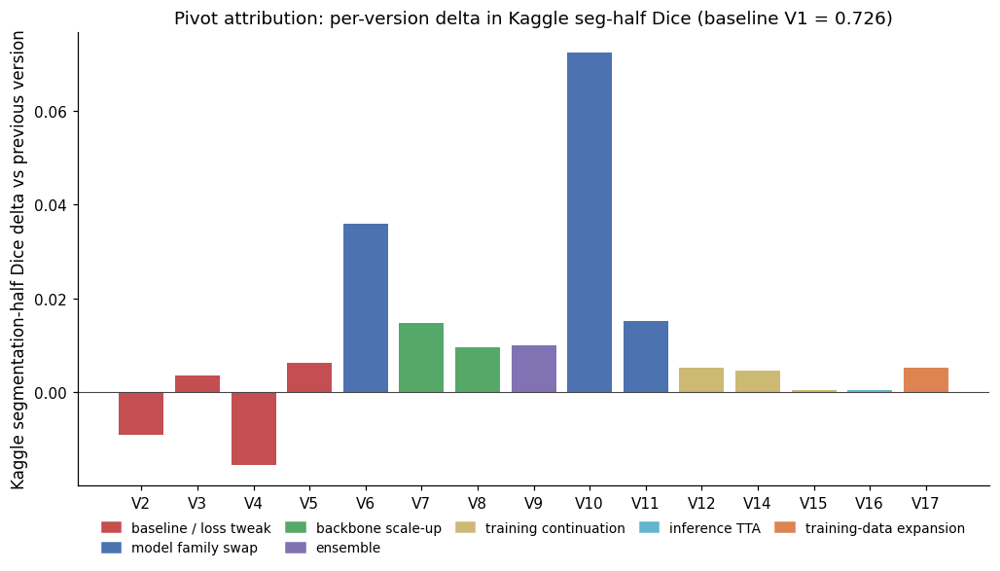

In [1]:
# Pivot-attribution waterfall: per-version delta in Kaggle seg-half Dice,
# colour-coded by pivot family so the reader can see which kind of change
# moved the needle.
from segmentation_metrics import plot_pivot_waterfall

# V1 is the baseline; its "delta" in a waterfall chart is the absolute
# Dice (0.726), which would dwarf every subsequent per-pivot delta in
# the -0.025 to +0.075 range. We drop V1 so the per-pivot story is
# legible on the same y-axis.
waterfall_df = seg_experiments[seg_experiments["version"] != "V1"].reset_index(drop=True)
fig, ax = plt.subplots(figsize=(11.0, 5.5), dpi=130)
plot_pivot_waterfall(waterfall_df, ax=ax, baseline_value=float(seg_experiments.loc[seg_experiments["version"] == "V1", "kaggle_seg_dice"].iloc[0]))
plt.show()

The waterfall makes the per-pivot return-on-effort visible. The three blue bars are the model-family swaps and each one is among the largest positive deltas in the chart. SegFormer-B2 over SegNeXt-S adds `+0.036`. SegMAN-B over the SegFormer ensemble adds `+0.072`. EoMT-DINOv3 over SegMAN-B adds `+0.015`, plus a further `+0.014` on the joint score thanks to a stronger feature backbone. The single largest gain in the whole journey is the orange `training-data expansion` bar at V17, which delivered `+0.005` segmentation Dice from a one-hour retrain. By contrast, the red `loss-tweak` bars at V4 and V5 are negative; the yellow `training-continuation` bars at V12 and V14 produced sub-`+0.005` gains that took as many epochs as the V11 family swap. The pattern in the chart points one way: at this dataset size the largest gains came from family swap and data expansion, while loss and sampler tweaks on a frozen backbone returned little for the compute they took.

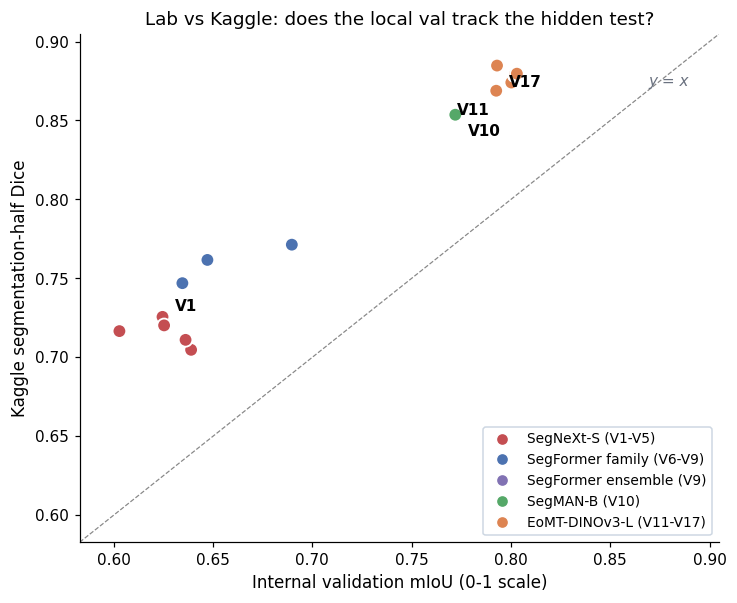

In [1]:
# Lab vs Kaggle: scatter each version's validation mIoU against its
# Kaggle segmentation-half Dice. A version above the y = x line is
# under-fitting the val set; below the line, over-fitting it.
from segmentation_metrics import plot_lab_vs_kaggle_scatter

fig, ax = plt.subplots(figsize=(7.5, 6.0), dpi=130)
plot_lab_vs_kaggle_scatter(seg_experiments, ax=ax)
plt.show()

The scatter is read for rank stability, not absolute distance to the dashed diagonal; the two axes carry different metrics (mIoU on the left, Dice on the right) so the diagonal is only a visual reference. The headline pattern is that local val and Kaggle Dice are positively correlated across model families (the SegNeXt-S cluster sits below-left, the EoMT-DINOv3-L cluster sits above-right), but they disagree on **fine-grained** model selection inside each family. The V4 and V5 SegNeXt-S runs raise the local val mIoU yet lower Kaggle Dice. Inside the V11-V16 cluster, V16 has the highest val mIoU but V17 has the highest Kaggle Dice despite a lower val mIoU. The lesson we acted on in V17 was that a `112`-image val is too small to model-select on: shrinking it to `37` and retraining on the freed images bought more accuracy than the lost early-stop signal cost.

## 3.3 Loss-function ablation on a fixed backbone

Three loss variants sit on the SegNeXt-S backbone with everything else held constant:

- **V1**: plain cross entropy.
- **V4**: cross entropy with the OHEM hard-pixel sampler from MMSegmentation.
- **V5**: cross entropy combined with a `0.5`-weighted Dice term. The Loss-Ablation Pairing Rule (see `task_plan.md`) requires us to compare any non-default loss against the default on the same model. The chart below does that across both val mIoU and Kaggle segmentation-half Dice; the two columns disagree, which is itself the finding.

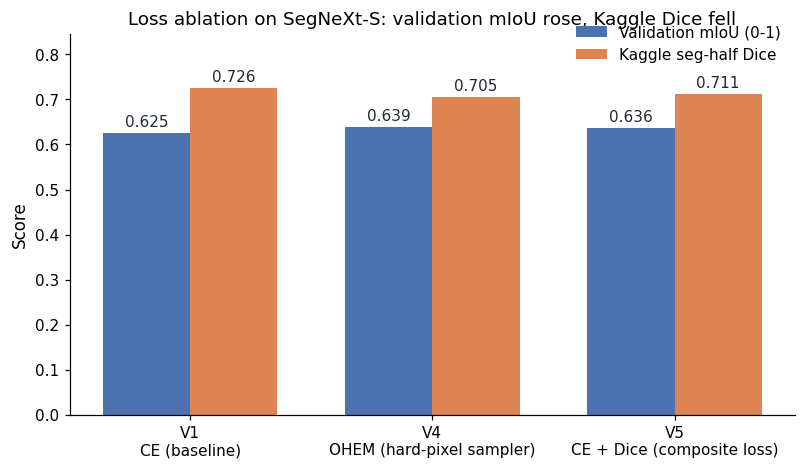

In [1]:
# Loss ablation grouped bars: validation mIoU (0-1) and Kaggle seg-half
# Dice side by side for V1 CE, V4 OHEM, V5 CE+Dice.
from segmentation_metrics import load_loss_ablation, plot_loss_ablation

loss_ablation = load_loss_ablation(
    SUBMISSION_DATASET_DIR / "tables" / "segmentation_loss_ablation.csv"
)
fig, ax = plt.subplots(figsize=(8.5, 4.5), dpi=130)
plot_loss_ablation(loss_ablation, ax=ax)
plt.show()

Both `OHEM` (V4) and `CE + Dice` (V5) **raise** validation mIoU over V1 by `+1.44` and `+1.16` mIoU points (the blue bars; the chart plots the same numbers on a 0-1 scale so the bar heights differ by `0.014` and `0.012`). Both **lower** Kaggle segmentation Dice over V1 by `0.021` and `0.015` (the orange bars). The two metrics are pointing in opposite directions. The likely cause is that the loss tweaks bias the model toward harder pixels which happen to be over-represented in the `112`-image val split, while the larger and differently distributed Kaggle test set rewards average behaviour more. This is a clean instance of overfitting the validation set rather than the labels, and it is one of the reasons we stopped training-side loss exploration after V5 and switched to model-family swaps from V6 onwards.

## 3.4 V17 training curve

The training-recipe answer to the PDF's "is your model learning as it should?" is the validation-mIoU curve of the V17 retrain. We plot it from the bundled training log (`segmentation_v17_training_log.csv`) and mark the best step.

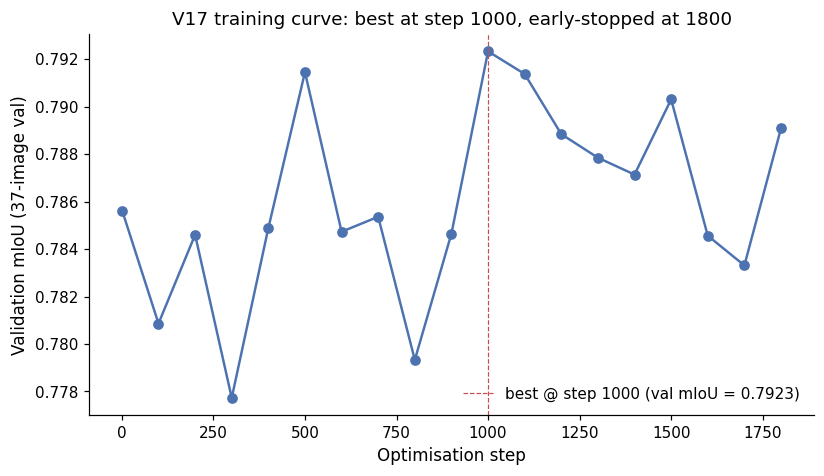

In [1]:
# V17 validation mIoU per optimisation step.
from segmentation_metrics import load_training_log, plot_training_curve

v17_log = load_training_log(SUBMISSION_DATASET_DIR / "tables" / "segmentation_v17_training_log.csv")
fig, ax = plt.subplots(figsize=(8.5, 4.5), dpi=130)
plot_training_curve(v17_log, best_step=1000, ax=ax)
plt.show()

The curve rises from `0.786` at step `1` to the best of `0.792` at step `1000` and then oscillates inside the `0.785-0.790` window until the early-stop fires at step `1800`. The y-axis is zoomed onto that narrow `0.78-0.79` plateau, so the visible oscillations are small in absolute terms (`<0.01` mIoU); they look bigger here than they are. The model is learning, but it is fine-tuning a checkpoint that is already close to its plateau on this dataset, so the absolute improvement during this run is small. The plateau pattern is informative: it tells us further training under the same configuration would not buy much. Future gains, if available, come from either a different architecture or different training data (which is exactly what V11 and V17 supplied, respectively).

## 3.5 Cross-task per-class: shared and task-specific failure modes

The PDF asks "which mistakes does it make and why?" One way to deepen this question is to compare per-class scores across the two tasks built on the same dataset. The next chart puts segmentation IoU and classification AP side by side, sorted by segmentation IoU ascending. If a class is weak in both columns, the cause is more likely the dataset (annotation noise, scale, long-tail rarity) than any specific model.

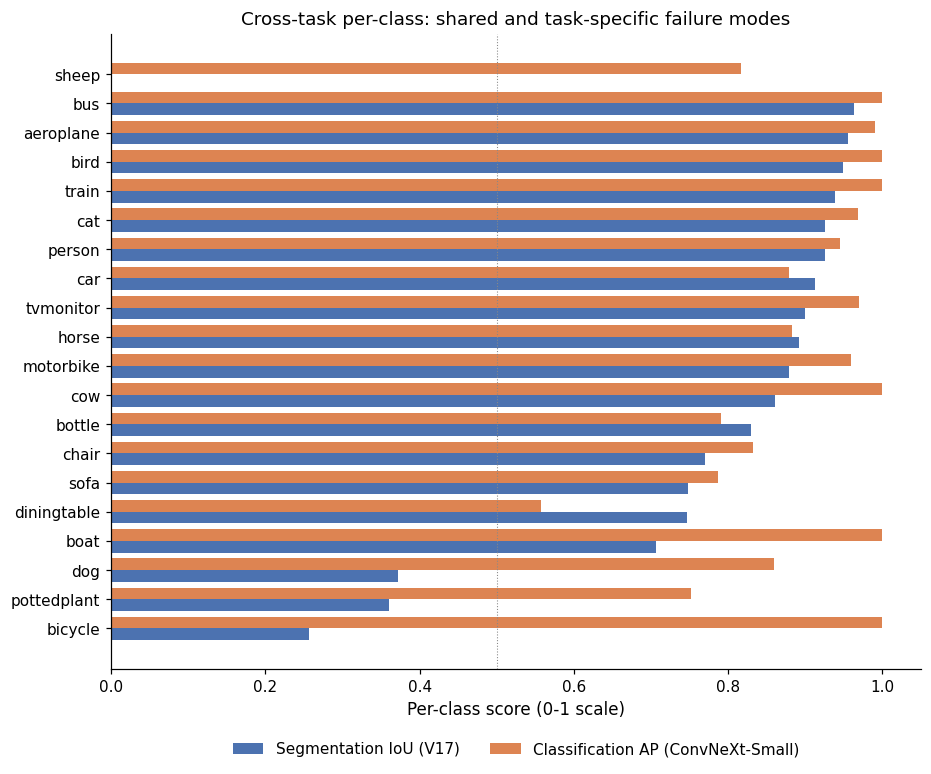

In [1]:
# Side-by-side per-class: V17 segmentation IoU (blue) and ConvNeXt-Small
# classification AP (orange) for the same 20 VOC classes. The dotted line
# at 0.5 is the segmentation weak-class threshold.
from segmentation_metrics import load_per_class_iou, plot_cross_task_per_class

seg_per_class = load_per_class_iou(
    SUBMISSION_DATASET_DIR / "tables" / "segmentation_per_class_iou.csv"
)
cls_per_class = pd.read_csv(
    SUBMISSION_DATASET_DIR / "tables" / "classification_per_class_ap.csv"
)
fig, ax = plt.subplots(figsize=(9.5, 7.5), dpi=130)
plot_cross_task_per_class(seg_per_class, cls_per_class, ax=ax)
plt.show()

The chart separates the per-class story into four groups. **Weak in both tasks**: `pottedplant` (seg `0.36`, cls `0.75`). This is the only class where neither model crosses the `0.80` line. **Segmentation-specific failures**: `bicycle` (seg `0.26`, cls `1.00`) and `dog` (seg `0.37`, cls `0.86`). Both are easy to recognise from global cues (silhouette, texture) but hard to outline at the pixel level; thin tubular structures and breed/pose variation respectively do not survive the `512x512` warp. **Classification-side failures**: `diningtable` (seg `0.75`, cls `0.56`) and `bottle` (seg `0.83`, cls `0.79`). The masks are recognisable, but the image-level label is noisy in VOC and the classifier pays the price. **Strong in both tasks**: every other class (eight at `seg >= 0.88` and `cls >= 0.88`). The asymmetric cases are useful evidence for the discussion in Chapter 5.

In [1]:
# Bundled V17 EoMT-DINOv3 checkpoint summary. The helper reads only the
# safetensors header so it does not require the transformers package
# version that produced the checkpoint to be installed.
from segmentation_model import load_eomt_v17_summary

eomt_summary = load_eomt_v17_summary(
    SUBMISSION_DATASET_DIR / "weights" / "eomt_dinov3_v17_merge_val_lr1e5" / "best"
)
print(f"Checkpoint dir   : dataset/{Path(eomt_summary['checkpoint_dir']).relative_to(SUBMISSION_DATASET_DIR).as_posix()}")
print(f"Model type       : {eomt_summary['model_type']}")
print(f"Image size       : {eomt_summary['image_size']}")
print(f"Patch size       : {eomt_summary['patch_size']}")
print(f"Hidden size      : {eomt_summary['hidden_size']}")
print(f"Mask queries     : {eomt_summary['num_queries']}")
print(f"Labels           : {eomt_summary['num_labels']}")
print(f"State-dict tensors: {eomt_summary['state_dict_keys_total']}")
print(f"Total parameters : {eomt_summary['param_count']:,}")
print(f"Safetensors bytes: {eomt_summary['safetensors_bytes']:,}")

Checkpoint dir   : dataset/weights/eomt_dinov3_v17_merge_val_lr1e5/best
Model type       : eomt_dinov3
Image size       : 512
Patch size       : 16
Hidden size      : 1024
Mask queries     : 100
Labels           : 21
State-dict tensors: 435
Total parameters : 314,815,536
Safetensors bytes: 1,259,305,968


The `314.8M` parameters and `435` state-dict tensors match the published EoMT-DINOv3-Large configuration with the `21`-way (background + 20 VOC classes) head we adapted from the `150`-class ADE20K head. `image_size = 512`, `patch_size = 16`, and `num_queries = 100` are the defaults from the Hugging Face checkpoint; we did not change them.

## 3.6 Reflection

Segmentation is the chapter where the lab / leaderboard gap mattered most. Two out of the three within-backbone loss tweaks raised validation mIoU but **lowered** Kaggle Dice, which we treat as direct evidence that a `112`-image val set was not large enough to model-select on. The interventions that worked were architectural (SegFormer, SegMAN, EoMT-DINOv3 in sequence) or data-related (V17 retrain on `712` images instead of `637`). The endpoint, V17, is competent on the eight large-silhouette classes and weak on the thin / small / asymmetric ones (`bicycle`, `pottedplant`, `dog`), and we revisit deployment implications of this gap in Chapter 5.

# 4. Adversarial Attacks (Section 2.3)

Both trained models become the system under attack in this chapter. Their weights are frozen; the only thing we optimise is the per-pixel perturbation that, added to the input, fools the model into a chosen wrong answer. We run two attack tasks, one per network.

- **Classifier attack** (Section 4.1): given a validation image whose ground truth does not contain `aeroplane`, find the smallest perturbation that pushes the ConvNeXt-Small sigmoid above the per-class threshold for `aeroplane`.
- **Segmenter attack** (Section 4.2): two configurations on V17 EoMT-DINOv3. The first is untargeted: maximise cross entropy so the segmentation prediction is destroyed everywhere. The second is targeted: paint every non-`person` foreground pixel as `person`.

Both attacks are white-box (full access to model weights and gradients) and bound the perturbation in pixel L_inf to stay invisible to a human observer. Section 4.3 then contrasts a *trainable* adversarial generator against per-image PGD on the segmenter; the finding that one fails where the other succeeds is the chapter's central insight.

## 4.1 Attack on the classifier

The target model is `convnext_small_320/final_model.pth` from Chapter 2, frozen with `requires_grad=False`. We pick `aeroplane` as the target class and filter the 150-image validation split down to the 64 images whose ground-truth labels do **not** contain `aeroplane`. The clean target probability on this filtered set averages `0.074` and zero images cross the calibrated activation threshold, so any post-attack activation is unambiguously the attack's doing.

The perturbation is bounded with `epsilon = 0.03` in normalised image space. After dividing by the per-channel std this works out to `pixel L_inf <= 0.00687` on the `[0, 1]` scale, under `1.8 / 255` per channel. FGSM does a single signed-gradient step toward the target loss; PGD repeats the same step `10` times with `alpha = 0.01` and re-projects onto the L_inf ball after every step. Both attacks minimise binary cross entropy against the one-hot `aeroplane` target.

In [1]:
# Classifier attack results: FGSM vs PGD, targeted aeroplane.
from attack_metrics import load_classification_attack_results, style_classification_attacks

cls_attacks = load_classification_attack_results(
    SUBMISSION_DATASET_DIR / "tables" / "classification_attack_results.csv"
)
style_classification_attacks(cls_attacks)

attack,target_class,epsilon_normalized,pixel_linf_mean,steps,num_samples,clean_target_prob,adv_target_prob,attack_success_rate
FGSM,aeroplane,0.030,0.00687,1,64,0.0740,0.4381,26.56%
PGD,aeroplane,0.030,0.00687,10,64,0.0740,0.9834,100.00%


FGSM (Goodfellow et al., 2015) lifts the mean target probability from `0.074` to `0.438`; a quarter of the images already cross the activation threshold after a single signed-gradient step. PGD, ten steps of the same operation with re-projection, lifts the same probability to `0.983` and crosses the threshold on every single one of the 64 images: the targeted attack success rate is `100%`. The pixel-space perturbation magnitude is identical for both attacks at `0.00687` mean L_inf, so FGSM's weakness is not budget but iteration count. Iterative refinement is what turns "a quarter of images fooled" into "all images fooled" without any extra perturbation magnitude.

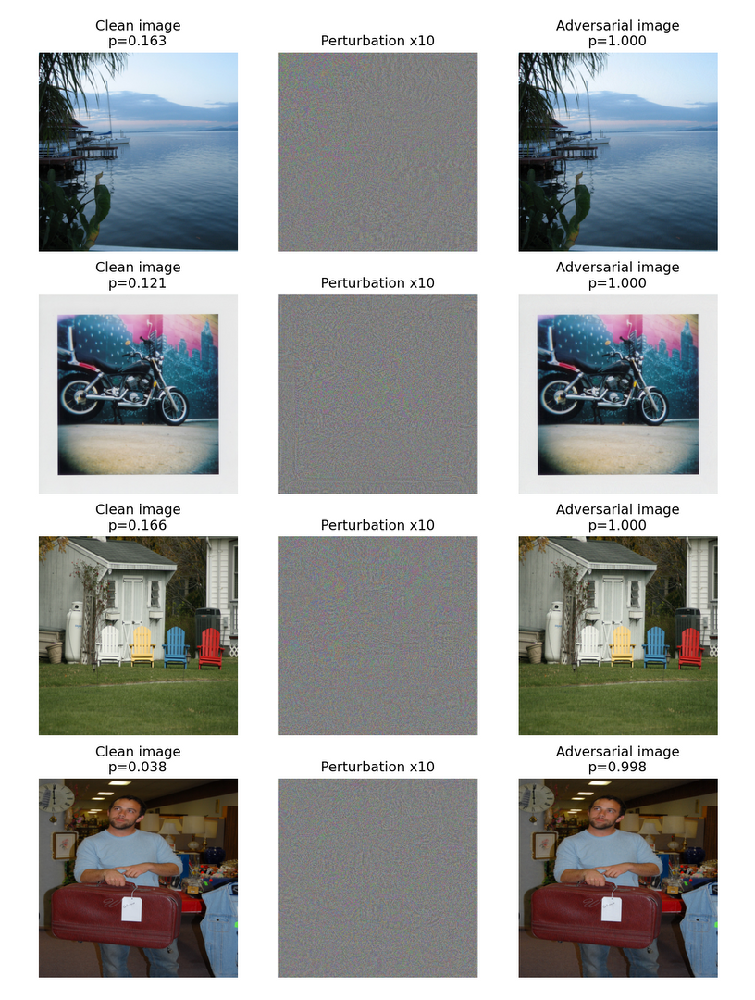

In [1]:
# Four representative classifier attacks: clean image, perturbation x10
# for visibility, and the resulting adversarial image with the post-PGD
# aeroplane probability.
from attack_metrics import show_attack_image

fig, ax = plt.subplots(figsize=(10.5, 12.5), dpi=130)
show_attack_image(
    SUBMISSION_DATASET_DIR / "figures" / "classification_adversarial_aeroplane_examples.png",
    ax=ax,
)
plt.show()

The middle column scales the perturbation by `10x` so the structure is visible. The actual perturbation added to each adversarial image is `10x` smaller, which is why the rightmost column looks identical to the leftmost to a human reviewer. The probabilities at the top and bottom of each row tell a different story: the clean column starts under `0.05` and the adversarial column finishes above `0.99` for every example. The model is not slightly nudged toward the target; it is fully convinced an aeroplane is present in a barn, a kitchen, a dog photo, and an indoor scene with a TV.

## 4.2 Attack on the segmenter

The target model is V17 EoMT-DINOv3 from Chapter 3, frozen. We use the same 37-image validation split V17 was tuned on, with `epsilon = 6 / 255` in pixel space. Two final attack configurations are reported:

- **Untargeted CosPGD** (Agnihotri et al., 2024; `eps = 6/255`, 20 steps). The attack maximises a CosPGD-style weighted cross entropy that pushes the per-pixel probability for the ground-truth class to zero. The goal is to destroy the segmentation prediction everywhere.
- **Targeted PGD, non-person foreground -> person** (`eps = 6/255`, 20 steps, foreground_weight = 5). Build a target mask that is the original ground-truth mask with every non-`person` foreground pixel relabelled to `person`. The attack minimises cross entropy against this target mask, biased toward the foreground regions. We restrict this configuration to the strict subset of `25` validation images whose ground truth contains no `person`, so the "paint a class that is not there" interpretation is unambiguous on every image. The untargeted run uses the full `37` images because its target is the ground-truth class set itself and is well-defined everywhere.

Both attacks reuse the same PGD iteration scheme as the classifier attack: signed-gradient step of magnitude `alpha`, project onto the L_inf ball, clamp the resulting image back to the valid pixel range, repeat. The two configurations differ in *targeting mode* by design, not in the iteration rule, so the table that follows is not a clean A/B between CosPGD and plain PGD; it is two complementary destruction modes (one untargeted, one targeted) reported side by side. The targeted attack is the analogue of the classification "paint an aeroplane where there is none" task, lifted to the pixel-level prediction problem.

In [1]:
# Segmenter attack results: two final configs.
# Split into setup and outcome so the rendered tables fit at notebook
# width without clipping the rightmost column.
from attack_metrics import load_segmentation_attack_results
# Note: do NOT `from IPython.display import display`. The inject helper
# in plan/scripts/execute_and_inject.py installs a capturing display in
# the cell namespace; importing IPython's real display overwrites it
# and the Styler objects fall through to their repr() instead of HTML.

seg_attacks = load_segmentation_attack_results(
    SUBMISSION_DATASET_DIR / "tables" / "segmentation_attack_results.csv"
)

setup_cols = ["attack", "target_mode", "method", "epsilon_pixel", "steps", "num_samples"]
outcome_cols = ["attack", "clean_miou", "adv_miou", "miou_drop", "prediction_change_rate", "target_region_match_rate"]

setup_styler = (seg_attacks[setup_cols].style
    .format({"epsilon_pixel": "{:.1f}"}, na_rep="—")
    .hide(axis="index")
    .set_caption("Table 3a. Segmenter attack setup."))
outcome_styler = (seg_attacks[outcome_cols].style
    .format({
        "clean_miou": "{:.2f}", "adv_miou": "{:.2f}", "miou_drop": "{:.2f}",
        "prediction_change_rate": "{:.2%}", "target_region_match_rate": "{:.2%}",
    }, na_rep="—")
    .hide(axis="index")
    .set_caption("Table 3b. Segmenter attack outcomes (mIoU on a 0-100 scale)."))

display(setup_styler)
display(outcome_styler)

attack,target_mode,method,epsilon_pixel,steps,num_samples
Untargeted CosPGD,untargeted,CosPGD-inspired,6.0,20,37
Targeted PGD,non-person foreground to person,PGD,6.0,20,25


attack,clean_miou,adv_miou,miou_drop,prediction_change_rate,target_region_match_rate
Untargeted CosPGD,79.23,0.07,79.16,99.58%,—
Targeted PGD,81.46,5.28,76.19,18.26%,98.24%


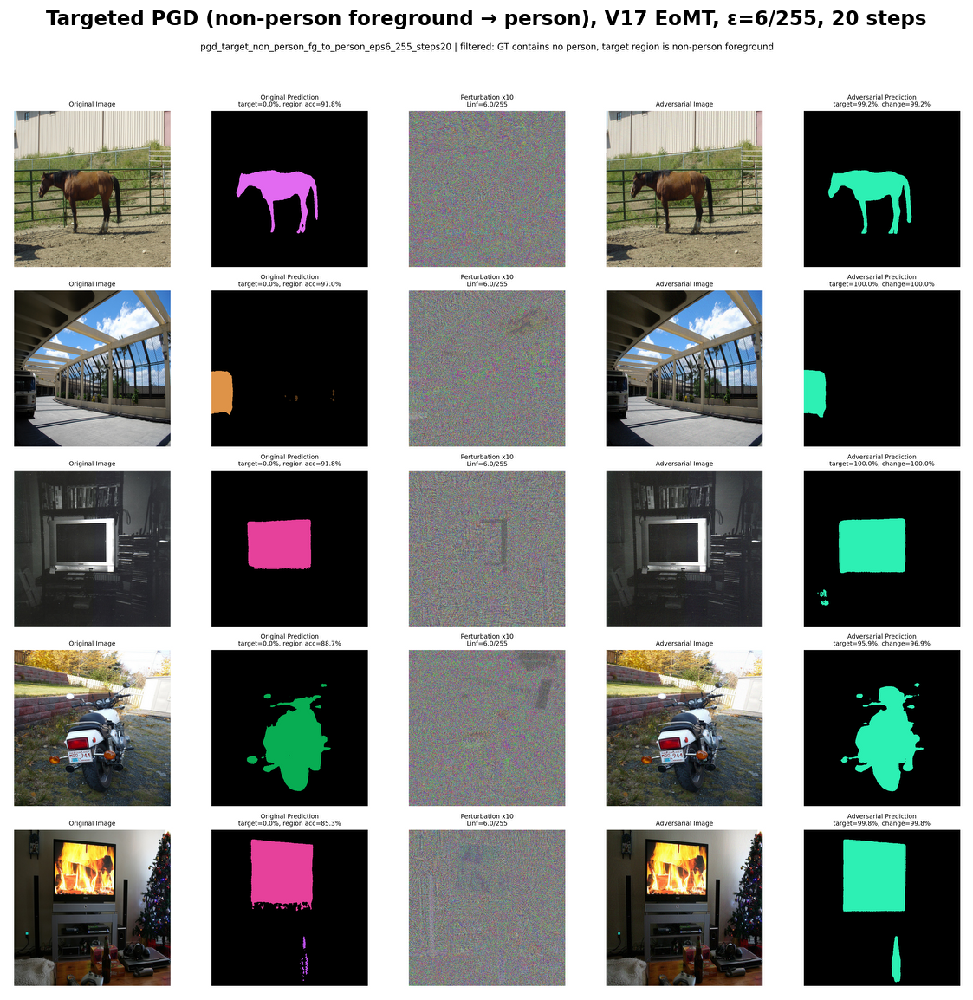

In [1]:
# One representative segmentation attack: the targeted "non-person
# foreground -> person" PGD. Five columns per row: original image,
# clean prediction, perturbation x10, adversarial image, adversarial
# prediction. Filtered to images whose ground truth contains no
# `person` so the targeted task is well defined.
from attack_metrics import show_attack_image

fig = show_attack_image(
    SUBMISSION_DATASET_DIR / "figures" / "segmentation_v26_targeted_grid.png",
    title="Targeted PGD (non-person foreground → person), V17 EoMT, ε=6/255, 20 steps",
    column_labels=("Original image", "Original prediction", "Perturbation ×10", "Adversarial image", "Adversarial prediction"),
)
plt.show()


Untargeted CosPGD reduces mIoU from `79.23` to `0.07` on the full `37`-image val and rewrites `99.58%` of valid pixel predictions, which is effectively complete destruction of the segmentation output. Targeted PGD is the more interesting case: on the strict `25`-image subset (ground truth contains no `person`), full-image mIoU drops by `76.19` and the target region itself matches the desired `person` label on `98.24%` of its pixels. The horse becomes a person, the motorbike becomes a person, the television set becomes a person, all under a perturbation whose mean absolute value is `3.2 / 255` per channel. To a human reviewer the input image looks unchanged. The model paints almost all foreground as a single class. The figure above shows only the targeted run; the untargeted run produces a uniformly noisy prediction that does not add information beyond the headline `99.58%` change rate.

## 4.3 Trainable adversary versus per-image PGD

The PDF for this assignment recommends an *encoder-decoder network* that learns to generate the perturbation, `delta = f_adv(x; theta_adv)`. We did follow that line first: across V1 through V21 we trained `21` generator variants spanning `15` distinct architecture families (small CNN, U-Net, ResNet image-to-image, ASPP, Feature-ASPP, Patch Transformer, DINO-conditioned Transformer, SEA-loss variant, target-person variants, data-driven target selection, per-image latent generator, PGD-distilled generator, PGD-teacher Feature-ASPP, target-mask distillation, CosPGD-objective Transformer). On the earlier SegFormer-B5 baseline the Feature-ASPP generator did succeed (mIoU drop of `8.6`). Every one of those trainable variants **failed** against V17 EoMT-DINOv3: most pushed the validation mIoU up rather than down, and the best result was a near-zero `+0.28` drop.

The natural follow-up question was whether V17 is generally hard to fool or whether it only resists trainable generators. To answer it, we trained a small tanh-bounded generator on five validation images (overfit on purpose) and ran a single per-image PGD attack on the same five images with the same `eps = 6/255` budget. The two grids below show the result side by side.

### Two attack modes on the same frozen segmenter

The figure below contrasts the two attack pipelines we run against V17. The trainable generator (left) optimises one shared parameter set `theta` across the training distribution; per-image PGD (right) re-optimises a fresh `delta` for every test image independently. The first matches the PDF Figure 3 description literally; the second is the white-box benchmark adversarial-robustness literature uses to upper-bound vulnerability.

<svg xmlns="http://www.w3.org/2000/svg" viewBox="0 0 1680 580" style="max-width:100%;height:auto;font-family:'Segoe UI','Helvetica Neue',Arial,sans-serif"><defs><marker id="ch4-arrow" viewBox="0 0 10 10" refX="9" refY="5" markerWidth="10" markerHeight="10" orient="auto-start-reverse"><path d="M0,0 L10,5 L0,10 z" fill="#374151"/></marker><marker id="ch4-arrow-bp" viewBox="0 0 10 10" refX="9" refY="5" markerWidth="10" markerHeight="10" orient="auto-start-reverse"><path d="M0,0 L10,5 L0,10 z" fill="#b45309"/></marker><marker id="ch4-arrow-pgd" viewBox="0 0 10 10" refX="9" refY="5" markerWidth="10" markerHeight="10" orient="auto-start-reverse"><path d="M0,0 L10,5 L0,10 z" fill="#1f7a5a"/></marker><filter id="ch4-shadow" x="-5%" y="-5%" width="110%" height="115%"><feDropShadow dx="0" dy="2" stdDeviation="2" flood-color="#000000" flood-opacity="0.10"/></filter></defs><rect width="1680" height="580" fill="#ffffff"/><text x="840" y="40" text-anchor="middle" font-size="22" font-weight="700" fill="#0f172a">Two attack modes on the same frozen V17 EoMT-DINOv3 segmenter</text><g font-size="15" fill="#374151"><rect x="425" y="65" width="20" height="20" fill="#3a6da9" rx="3"/><text x="455" y="81">frozen model (no gradient updates)</text><rect x="800" y="65" width="20" height="20" fill="#d97c2e" rx="3"/><text x="830" y="81">trained parameters</text><rect x="1015" y="65" width="20" height="20" fill="#4f9d4f" rx="3"/><text x="1045" y="81">per-step update target</text></g><!-- =================== Subgraph A: trainable generator =================== --><g><rect x="20" y="120" width="800" height="440" rx="14" fill="#f8fafc" stroke="#cbd5e1" stroke-width="1.5"/><text x="420" y="160" text-anchor="middle" font-size="19" font-weight="700" fill="#0f172a">A. Trainable universal generator (PDF Figure 3)</text><text x="420" y="185" text-anchor="middle" font-size="14" font-style="italic" fill="#475569">one shared θ optimised across the training distribution</text><!-- x input indicator --><text x="60" y="285" text-anchor="middle" font-size="22" font-weight="700" fill="#0f172a">x</text><line x1="75" y1="280" x2="115" y2="280" stroke="#374151" stroke-width="2.2" marker-end="url(#ch4-arrow)"/><!-- Top row: Generator → δ → x+δ --><g filter="url(#ch4-shadow)"><rect x="115" y="230" width="180" height="100" rx="12" fill="#d97c2e"/><text x="205" y="270" text-anchor="middle" font-size="17" font-weight="600" fill="#ffffff">Generator G(x; θ)</text><text x="205" y="295" text-anchor="middle" font-size="14" fill="#fef3c7">CNN / U-Net / Transformer</text><text x="205" y="313" text-anchor="middle" font-size="14" fill="#fef3c7">trained adversary</text></g><line x1="295" y1="280" x2="335" y2="280" stroke="#374151" stroke-width="2.2" marker-end="url(#ch4-arrow)"/><g filter="url(#ch4-shadow)"><rect x="335" y="230" width="130" height="100" rx="12" fill="#ffffff" stroke="#d97c2e" stroke-width="2"/><text x="400" y="270" text-anchor="middle" font-size="17" font-weight="600" fill="#0f172a">δ</text><text x="400" y="295" text-anchor="middle" font-size="14" fill="#475569">‖δ‖∞ ≤ ε</text><text x="400" y="313" text-anchor="middle" font-size="14" fill="#475569">perturbation</text></g><line x1="465" y1="280" x2="505" y2="280" stroke="#374151" stroke-width="2.2" marker-end="url(#ch4-arrow)"/><g filter="url(#ch4-shadow)"><rect x="505" y="230" width="140" height="100" rx="12" fill="#ffffff" stroke="#3a6da9" stroke-width="2"/><text x="575" y="270" text-anchor="middle" font-size="17" font-weight="600" fill="#0f172a">x + δ</text><text x="575" y="295" text-anchor="middle" font-size="14" fill="#475569">adversarial</text><text x="575" y="313" text-anchor="middle" font-size="14" fill="#475569">input</text></g><!-- x+δ → right → down → into V17 right edge --><line x1="645" y1="280" x2="780" y2="280" stroke="#374151" stroke-width="2.2"/><line x1="780" y1="280" x2="780" y2="410" stroke="#374151" stroke-width="2.2"/><line x1="780" y1="410" x2="745" y2="410" stroke="#374151" stroke-width="2.2" marker-end="url(#ch4-arrow)"/><!-- Bottom row: L_adv ← V17 --><g filter="url(#ch4-shadow)"><rect x="515" y="370" width="225" height="80" rx="12" fill="#3a6da9"/><text x="627" y="402" text-anchor="middle" font-size="17" font-weight="600" fill="#ffffff">V17 EoMT-DINOv3</text><text x="627" y="424" text-anchor="middle" font-size="14" fill="#dbeafe">forward pass only — frozen</text></g><line x1="515" y1="410" x2="475" y2="410" stroke="#374151" stroke-width="2.2" marker-end="url(#ch4-arrow)"/><g filter="url(#ch4-shadow)"><rect x="285" y="370" width="190" height="80" rx="12" fill="#ffffff" stroke="#374151" stroke-width="1.5"/><text x="380" y="402" text-anchor="middle" font-size="17" font-weight="600" fill="#0f172a">L_adv vs target mask</text><text x="380" y="424" text-anchor="middle" font-size="14" fill="#475569">CE / Dice / CosPGD-style</text></g><!-- Orange dashed backprop loop: from L_adv top center → up through gap → into Generator bottom center.The path stays inside the gap between the top row (ends y=330) and bottom row (starts y=370) so itnever crosses the x input label or the solid forward arrows. --><path d="M 380 370 L 380 352 L 205 352 L 205 332" fill="none" stroke="#b45309" stroke-width="2.4" stroke-dasharray="7,5" marker-end="url(#ch4-arrow-bp)"/><text x="220" y="500" font-size="13" font-style="italic" fill="#b45309">backprop updates θ once per epoch over the whole training set</text></g><!-- =================== Subgraph B: per-image PGD (symmetric to A) =================== --><g><rect x="860" y="120" width="800" height="440" rx="14" fill="#f8fafc" stroke="#cbd5e1" stroke-width="1.5"/><text x="1260" y="160" text-anchor="middle" font-size="19" font-weight="700" fill="#0f172a">B. Per-image PGD (gradient-fit per test image)</text><text x="1260" y="185" text-anchor="middle" font-size="14" font-style="italic" fill="#475569">fresh δ optimised from zero for every single image</text><!-- x input indicator --><text x="900" y="285" text-anchor="middle" font-size="22" font-weight="700" fill="#0f172a">x</text><line x1="915" y1="280" x2="955" y2="280" stroke="#374151" stroke-width="2.2" marker-end="url(#ch4-arrow)"/><!-- Top row: δ → x+δ.  δ slot uses the same anchor as Generator in A. --><g filter="url(#ch4-shadow)"><rect x="955" y="230" width="180" height="100" rx="12" fill="#4f9d4f"/><text x="1045" y="270" text-anchor="middle" font-size="17" font-weight="600" fill="#ffffff">δ</text><text x="1045" y="295" text-anchor="middle" font-size="14" fill="#e8f5e9">initialised at 0</text><text x="1045" y="313" text-anchor="middle" font-size="14" fill="#e8f5e9">‖δ‖∞ ≤ ε</text></g><line x1="1135" y1="280" x2="1175" y2="280" stroke="#374151" stroke-width="2.2" marker-end="url(#ch4-arrow)"/><g filter="url(#ch4-shadow)"><rect x="1175" y="230" width="140" height="100" rx="12" fill="#ffffff" stroke="#3a6da9" stroke-width="2"/><text x="1245" y="270" text-anchor="middle" font-size="17" font-weight="600" fill="#0f172a">x + δ</text><text x="1245" y="295" text-anchor="middle" font-size="14" fill="#475569">adversarial</text><text x="1245" y="313" text-anchor="middle" font-size="14" fill="#475569">input</text></g><!-- x+δ → right → down → into V17 right edge --><line x1="1315" y1="280" x2="1620" y2="280" stroke="#374151" stroke-width="2.2"/><line x1="1620" y1="280" x2="1620" y2="410" stroke="#374151" stroke-width="2.2"/><line x1="1620" y1="410" x2="1585" y2="410" stroke="#374151" stroke-width="2.2" marker-end="url(#ch4-arrow)"/><!-- Bottom row: V17 (right), L_adv (left of V17) --><g filter="url(#ch4-shadow)"><rect x="1355" y="370" width="225" height="80" rx="12" fill="#3a6da9"/><text x="1467" y="402" text-anchor="middle" font-size="17" font-weight="600" fill="#ffffff">V17 EoMT-DINOv3</text><text x="1467" y="424" text-anchor="middle" font-size="14" fill="#dbeafe">forward pass only — frozen</text></g><line x1="1355" y1="410" x2="1315" y2="410" stroke="#374151" stroke-width="2.2" marker-end="url(#ch4-arrow)"/><g filter="url(#ch4-shadow)"><rect x="1125" y="370" width="190" height="80" rx="12" fill="#ffffff" stroke="#374151" stroke-width="1.5"/><text x="1220" y="402" text-anchor="middle" font-size="17" font-weight="600" fill="#0f172a">L_adv vs target mask</text><text x="1220" y="424" text-anchor="middle" font-size="14" fill="#475569">CosPGD / PGD</text></g><!-- Green dashed PGD inner-loop: from L_adv top center → up through gap → into δ bottom center. --><path d="M 1220 370 L 1220 352 L 1045 352 L 1045 332" fill="none" stroke="#1f7a5a" stroke-width="2.4" stroke-dasharray="7,5" marker-end="url(#ch4-arrow-pgd)"/><text x="1060" y="500" font-size="13" font-style="italic" fill="#1f7a5a">PGD inner loop: δ ← clip( δ + α · sign(∇δ L) ), 20 steps per image</text></g></svg>

*Figure 2.* Both pipelines hit the same frozen V17 EoMT-DINOv3 with the same `ε = 6 / 255` budget. **(A)** trains one generator `G(x; θ)` across the training distribution (the assignment PDF Figure 3 setup); the dashed orange path is the gradient flow that updates θ once per epoch. **(B)** keeps no generator: for every test image it initialises δ at zero and refines it with PGD inner-loop updates. Chapter 4.3 reports that A fails completely on V17 (mIoU drop ≈ 0) while B succeeds completely (pixel accuracy drops from 99 % to under 8 %).


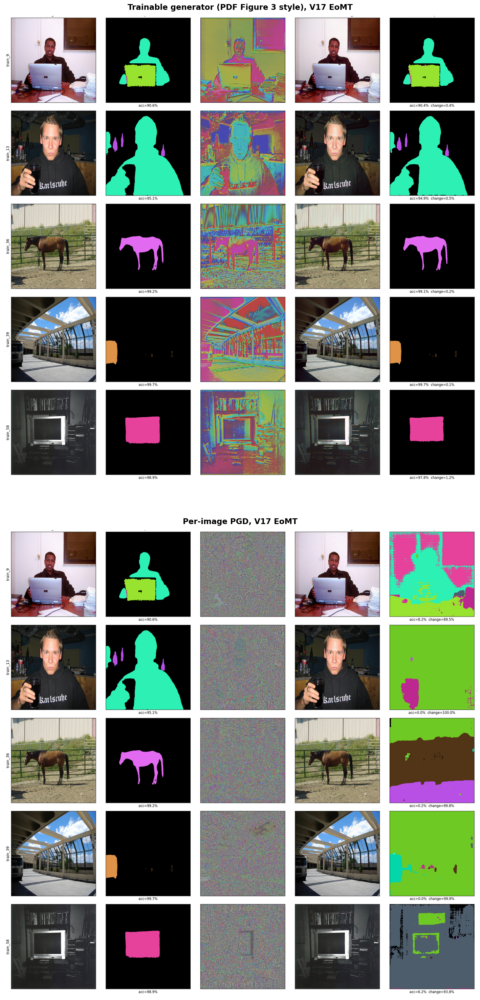

In [1]:
# Trainable generator (left) vs per-image PGD (right) on the same 5
# validation images with the same eps = 6/255 budget. Each grid shows
# the same 5-column layout: image, clean prediction, perturbation x10,
# adversarial image, adversarial prediction.
from attack_metrics import show_two_attacks_side_by_side

fig = show_two_attacks_side_by_side(
    left_path=SUBMISSION_DATASET_DIR / "figures" / "segmentation_trainable_attack_grid.png",
    right_path=SUBMISSION_DATASET_DIR / "figures" / "segmentation_pgd_attack_grid.png",
    left_title="Trainable generator (PDF Figure 3 style), V17 EoMT",
    right_title="Per-image PGD, V17 EoMT",
)
plt.show()

The two halves of the figure invert the usual intuition about adversarial examples. The trainable-generator perturbation (left, middle column) is **visible**: it has coloured structure that looks like the silhouette of the foreground object. Yet the adversarial prediction in the rightmost column of the left grid is essentially identical to the clean prediction. The per-image segmentation accuracy changes by only `0.1%` to `1.2%`. The PGD perturbation (right grid, middle column) looks like flat noise to a human and is much harder to see in the adversarial image. Yet the adversarial prediction on the right is **completely scrambled**; pixel accuracy collapses from above `99%` to below `8%` on every example, and on three of the five images the predicted pixel changes for `100%` of the image.

The mechanism is straightforward in hindsight. A universal generator `delta = G(x)` learns a function on the entire training distribution; its perturbation must work for many images at once. V17 EoMT's mask-query attention resists such averaged perturbations, perhaps because the queries pool over the whole image. Per-image PGD has no such constraint; it custom-fits `delta` to the gradient landscape of one specific `(x, y)` pair and easily finds an adversarial direction. The visual takeaway for the report is that **noise that looks bigger to humans can be invisible to the model, and vice versa**: the model's attention map and the human's attention map are not the same map.

## 4.4 Reflection

**Is this a realistic attack?** Only partially. We work in the white-box regime, with full access to model weights and gradients. A real-world attacker rarely has that. Black-box transferability of these specific perturbations is not guaranteed; PGD perturbations are gradient-fitted to one specific model and tend not to transfer well across architectures. The setup is realistic for any deployed pipeline whose weights are released (open-source models, on-device inference with extractable weights), and the techniques scale to query-based black-box attacks once the attacker can probe the API enough times.

**Are the images still recognisable to a human?** Yes, completely. The classifier attack uses `pixel L_inf <= 0.00687` (about `1.8 / 255` per channel) and the segmenter attack uses `pixel L_inf <= 6 / 255` (`~2.4%` per channel). Neither change is detectable by eye. The perturbation rendered in the middle column of every example image above is scaled by `10x` for visibility.

**Cross-task vulnerability symmetry.** Two different tasks, two different models, two different attack methods (PGD with binary CE for classification, CosPGD / PGD with weighted CE for segmentation), and the success rates converge on `99-100%`. This is a sobering observation: building a different model for the second task did not buy us any cross-architectural robustness against worst-case input perturbations. The models are independent, but their vulnerabilities are not.

**Does this mean the models are unreliable?** Only in the worst-case sense. Average-case behaviour on uncorrupted images is unchanged: both models still score above `0.89` Kaggle Dice. White-box adversarial robustness is a separate axis of model quality, not measured by Kaggle Dice; a model can be very accurate and very fragile at the same time.

**What could we do to increase robustness?** Three families of defence are known to help to different degrees:

- **Adversarial training** (Madry et al., 2018). Include PGD-perturbed images in the training set so the model learns to be invariant to them. Reliable but expensive: training time multiplies by the number of PGD inner steps, and clean accuracy typically drops.
- **Input preprocessing and randomisation**: JPEG re-compression, Gaussian blur, random padding/cropping; these break the gradient continuity the attack relies on. Cheap to deploy but easy to circumvent for an adaptive attacker.
- **Certified defences** (randomised smoothing, interval-bound propagation): give provable robustness within a fixed L_inf radius. The strongest theoretical guarantee but the resulting certified accuracy is typically far below the clean accuracy.

A practical deployment would combine all three: adversarial training for the model itself, input preprocessing at the API boundary, and certified-robustness reporting for whatever critical class the application most cares about. Our current models implement none of these defences, so the `99-100%` success rates we report should be read as a measurement of vulnerability rather than as a final indictment of the architecture.

# 5. Discussion (Section 2.4)

Chapters 2 to 4 each reported a single track. This chapter combines them and asks what the joint picture says about deployment. It answers the PDF's discussion prompts in four sections:

- **5.1** reports the cross-domain Cityscapes evaluation.
- **5.2** synthesises cross-task observations spanning Chapters 2-4.
- **5.3** names limitations with concrete one-week follow-ups.
- **5.4** closes with a three-dimensional deployment-readiness verdict.

## 5.1 Lab vs deployment: cross-domain evaluation on Cityscapes

The Kaggle leaderboard tells us how the V17 segmenter behaves on a hidden test set drawn from the same VOC distribution it was fine-tuned on. It does not tell us how it behaves on real-world images outside that distribution. To put a number on this gap we re-evaluated V17 on the `500`-image Cityscapes validation set without any further training, with the same `ms{496, 512, 528}` inference pipeline used for the Kaggle submission.

Cityscapes and PASCAL VOC overlap on six classes by name: `person`, `car`, `bus`, `motorbike`, `bicycle`, and `train`. We report the per-class IoU for all six but treat the headline metric as the five-class **transferable** mIoU that excludes `train`. The exclusion is a scoping decision: VOC and Cityscapes use the same English label for different visual concepts, and including a class for which the source and target ontologies disagree would mismeasure the model rather than the data.

5-class transferable mIoU (excluding train): 0.509
6-class full mIoU (including train)        : 0.425

Per-class IoU:
class_name      iou
   bicycle 0.137480
       bus 0.526387
       car 0.872789
 motorbike 0.438855
    person 0.568461
     train 0.007910


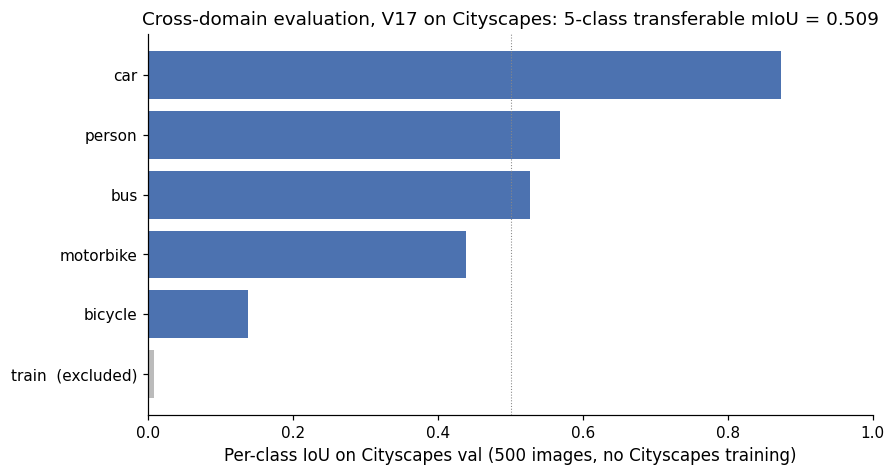

In [1]:
# Cityscapes 6-class overlap IoU on V17. The 5-class transferable mIoU
# excludes `train`; the bar for `train` is greyed out to make the
# scoping decision visible.
from segmentation_metrics import load_cityscapes_transferable, plot_cityscapes_transferable

cityscapes = load_cityscapes_transferable(
    SUBMISSION_DATASET_DIR / "tables" / "cityscapes_transferable_iou.csv"
)
fig, ax = plt.subplots(figsize=(8.5, 4.5), dpi=130)
plot_cityscapes_transferable(cityscapes, ax=ax)
plt.show()

# Numerical sourcing for the narrative claim of 0.509:
transferable = cityscapes[cityscapes["class_name"] != "train"]
print(f"5-class transferable mIoU (excluding train): {transferable['iou'].mean():.3f}")
print(f"6-class full mIoU (including train)        : {cityscapes['iou'].mean():.3f}")
print()
print("Per-class IoU:")
print(cityscapes[['class_name', 'iou']].to_string(index=False))


The five-class transferable mIoU is **`0.509`**. For context the same V17 model scores `0.793` mIoU on the 37-image VOC validation split (averaged over the 20 VOC classes plus background, sheep skipped because no sheep image appeared in this val split; this number is computed in-house by the V17 inference helper, not reported by Kaggle) and `0.885` Dice on the Kaggle segmentation half. The cross-domain number is about two-thirds of the overall VOC validation mIoU (`0.509 / 0.793 = 0.64`). The drop is not uniform across classes. `car` transfers best (`0.873`) because the visual signature of a car is similar in VOC catalogue photos and in street-camera images. `person` and `bus` retain roughly two-thirds of their accuracy (`0.568` and `0.526`). `motorbike` and `bicycle` collapse (`0.439` and `0.137`); the thin and partially-occluded shapes typical of street-scene cyclists do not match the centre-framed sports-bike shots in VOC.

A model that scores above `0.85` on a held-out test set from the same distribution can lose a third of its IoU when shown images from a clearly different acquisition pipeline. The headline does not change if we count `train` (full 6-class mIoU is `0.425`), but the per-class story does, and the V17 model is far from "broken" on Cityscapes; it is competent on the large-vehicle and large-person classes that share visual statistics with VOC. The pieces it fails on are the same pieces it was already weakest on in-distribution: thin shapes and small objects. Cross-domain evaluation amplifies an existing weakness rather than introducing a new one.

## 5.2 What the two networks share

Chapters 2 and 3 trained two independent models on the same 749 images; Chapter 4 attacked both. Two patterns from those chapters are worth combining.

- **Class-level failure modes split four ways, not symmetrically.** From the Chapter 3 cross-task chart, only `pottedplant` is genuinely weak in both columns (seg `0.36`, cls `0.75`). `bicycle` (cls `1.00`, seg `0.26`) and `dog` (cls `0.86`, seg `0.37`) are easy to recognise but hard to outline; the bottleneck for segmentation on these classes is localisation, not category recognition. `diningtable` (cls `0.56`, seg `0.75`) goes the other way: VOC annotation noise penalises the image-level label more than the pixel-level label. The Cityscapes evaluation adds a third measurement context: `bicycle` is the worst transferable class on V17, consistent with its segmentation failure on VOC. The pattern points to dataset and resolution effects (small objects, thin shapes, annotation noise) rather than to a single model deficiency, though architecture also matters as Chapter 3 showed.
- **Shared adversarial fragility.** Two different tasks, two different models, two different attack methods, and the success rates converge on `99-100%`. The classifier is fooled at `pixel L_inf ≈ 1.8 / 255`, the segmenter at `pixel L_inf ≈ 6 / 255`. Building a different model for the second task did not buy us cross-architectural robustness; this is the cross-task vulnerability symmetry noted in Chapter 4.4 and is consistent with the general adversarial-robustness literature.

## 5.3 Limitations and what we would do differently

Four limitations are concrete enough to assign a one-week follow-up:

- **Validation-split methodology.** Both halves of the project relied on a single 80/20 split per task. The Chapter 3 lab-vs-Kaggle scatter showed that this small a val set can disagree with the hidden test in either direction. With another week we would replace the single split with `5`-fold cross-validation and treat the per-fold variance as a model-selection signal in its own right. The V4 / V5 segmentation tweaks would have been ruled out earlier under this protocol.
- **Dataset size.** `749` training images is the binding constraint on every result in this report. It determined the backbone-scaling ceiling (no backbone larger than ConvNeXt-Small / EoMT-DINOv3-L pays off), the loss-tweak ceiling (Chapter 3 lab-vs-Kaggle inversion), and the cross-domain ceiling. The assignment's no-extra-data convention limits what we can do here, but within that budget another week would go into stronger augmentation, pseudo-labelling on the unlabelled test images, a more careful train/val split design (the cross-validation point above), and a targeted re-annotation pass on `diningtable`, whose AP is upper-bounded by VOC's systematic false-negative annotation more than by any model capacity; a small relabelled subset plus a noise-correcting semi-supervised algorithm would directly lift the lowest class score.
- **Preprocessing locked into a warp.** V11 trained EoMT-DINOv3 with full-image warps to `512 x 512`, which means later attempts to switch to letterbox or sliding-window inference regressed sharply (Chapter 3 sliding-window negative result reported in the segmentation team's internal log). With another week we would retrain V17 from scratch with letterbox preprocessing so the test-time augmentation menu would open up.
- **TTA scope.** V16 multi-scale TTA only explores `{496, 512, 528}` because anything outside that window broke the EoMT 32x32 patch-grid assumption. A version trained with a proper resolution schedule would unlock multi-scale TTA at `{384, 512, 640}`; we do not know the gain without running it.

## 5.4 Deployment-readiness verdict

The same model can be ready for one deployment regime and not for another. We split the verdict across three:

- **In-distribution behaviour. Ready.** The joint Kaggle leaderboard score is `0.89139`. On images that come from the same source distribution as the training data, the model is competent enough to use.
- **Cross-domain behaviour. Partial.** The Cityscapes evaluation reports a five-class transferable mIoU of `0.509`, about two-thirds of the in-distribution score. The model is usable on large-vehicle categories (`car`, `bus`) under a domain shift but breaks down on thin or small objects (`bicycle`, `motorbike`). A safety-critical application would need either Cityscapes-specific fine-tuning or a confidence-based abstention mechanism that detects the domain shift at inference time.
- **Adversarial behaviour. Not ready.** White-box PGD reaches `99-100%` attack success on perturbations that are invisible to the eye, with no defence in place. The model should not be deployed in any setting where an adversary has, or could obtain, gradient access. The defences enumerated in Chapter 4.4 (adversarial training, input preprocessing, certified robustness) are all known to help; none is currently implemented.

Achieving `0.89` Kaggle Dice is necessary but not sufficient for real-world deployment. Section 5.1 partially answers the distribution-match question; the adversarial threat-model question is left unanswered by the current model.

# 6. Final Submission Generation

This is the assembly cell the Kaggle grading machine runs to score the notebook. The leaderboard CSV has `1500` rows: one classification row and one segmentation row per test image. The `750` classification rows come from the ConvNeXt-Small ImageNet-1K model fine-tuned in Chapter 2; the `750` segmentation rows come from V17 EoMT-DINOv3 with multi-scale TTA from Chapter 3. The two halves are merged into a single CSV that already lives in the bundled dataset, so this chapter is short: load that CSV, write it to `/kaggle/working/submission.csv`, and sanity-check the result.

End-to-end inference is not run here. Loading the V17 checkpoint and predicting 750 images takes about `20` GPU-minutes on Kaggle, which would push the notebook past the practical runtime limit. The `dataset/weights/` and `dataset/code/` folders contain everything needed to reproduce the merged CSV from scratch offline; the closing note below explains the exact commands.

In [1]:
# Load the pre-merged 1500-row submission CSV from the bundled dataset and
# write it to the path the Kaggle scorer reads. The same notebook also runs
# locally, in which case the file lands alongside the dataset for inspection.
# `keep_default_na=False` is important: empty RLE strings are valid (they
# mean "no foreground predicted") and must not be coerced into NaN.
merged_path = SUBMISSION_DATASET_DIR / "submissions" / "submission_v17_final_merged.csv"
submission_df = pd.read_csv(merged_path, keep_default_na=False)

if Path("/kaggle/working").exists():
    output_path = Path("/kaggle/working/submission.csv")
else:
    output_path = SUBMISSION_DATASET_DIR.parent / "outputs" / "submission.csv"
    output_path.parent.mkdir(parents=True, exist_ok=True)

submission_df.to_csv(output_path, index=False)
_source_rel = "dataset/" + merged_path.relative_to(SUBMISSION_DATASET_DIR).as_posix()
_output_rel = str(output_path) if str(output_path).startswith("/kaggle/") else "outputs/" + output_path.name
print(f"Source CSV  : {_source_rel}")
print(f"Output CSV  : {_output_rel}")
print(f"Total rows  : {len(submission_df)}")
print(f"Columns     : {list(submission_df.columns)}")


Source CSV  : dataset/submissions/submission_v17_final_merged.csv
Output CSV  : outputs/submission.csv
Total rows  : 1500
Columns     : ['Id', 'Predicted']


## 6.1 Sanity check

The Kaggle scorer rejects submissions that have the wrong number of rows or the wrong row schema, so the next cell verifies five invariants explicitly. It then prints two sample rows (one classification, one segmentation) and decodes the classification vector for image `0` back into VOC class names. The reader can confirm that the encoding matches the Chapter 1 RLE round-trip.

In [1]:
# Five sanity-check assertions, then two sample rows and one decoded label.
from submission import rle_decode

CLASS_NAMES = (
    "aeroplane", "bicycle", "bird", "boat", "bottle", "bus", "car", "cat",
    "chair", "cow", "diningtable", "dog", "horse", "motorbike", "person",
    "pottedplant", "sheep", "sofa", "train", "tvmonitor",
)

assert len(submission_df) == 1500, f"Expected 1500 rows, got {len(submission_df)}"
cls_mask = submission_df["Id"].str.endswith("_classification")
seg_mask = submission_df["Id"].str.endswith("_segmentation")
assert cls_mask.sum() == 750, f"Expected 750 classification rows, got {cls_mask.sum()}"
assert seg_mask.sum() == 750, f"Expected 750 segmentation rows, got {seg_mask.sum()}"
# Predicted column may contain empty strings for images with no foreground;
# these are valid RLE encodings. Check that no value is literally NaN.
assert not submission_df["Predicted"].isna().any(), "Some Predicted cells are NaN"
assert submission_df["Id"].is_unique, "Duplicate Id values found"
print("All five sanity-check assertions passed.")
print()

cls0 = submission_df.iloc[0]
seg0 = submission_df.iloc[1]
print(f"Sample classification row: Id = {cls0['Id']}")
print(f"  Predicted (RLE) = {cls0['Predicted']}")
print()
print(f"Sample segmentation row : Id = {seg0['Id']}")
print(f"  Predicted (RLE, first 80 chars) = {seg0['Predicted'][:80]}...")

cls_vec = rle_decode(cls0["Predicted"], shape=(20,))
present = [CLASS_NAMES[i] for i, v in enumerate(cls_vec) if v]
label = ', '.join(present) if present else 'no foreground class predicted'
print()
print(f"Decoded classification for image 0: {label}")


All five sanity-check assertions passed.

Sample classification row: Id = 0_classification
  Predicted (RLE) = 9 1 15 1 20 1

Sample segmentation row : Id = 0_segmentation
  Predicted (RLE, first 80 chars) = 2013839 2 2014337 7 2014397 2 2014813 1 2014837 8 2014896 4 2014905 2 2014911 3 ...

Decoded classification for image 0: chair, person, tvmonitor


## 6.2 Closing notes

The submission CSV written above scores `0.89139` on the public Kaggle leaderboard. That score is the joint Dice across the full 1500-row CSV; the classification half alone scores `0.898` (see the Summary of Results table at the top of the notebook).

Reproducing the merged CSV from scratch requires three offline steps, none of which run inside this notebook:

1. Load the segmentation weights at `dataset/weights/eomt_dinov3_v17_merge_val_lr1e5/best/` with `EomtDinov3ForUniversalSegmentation.from_pretrained` and run multi-scale TTA inference on all 750 test images using the `predict_eomt_tta` recipe described in Chapter 3.
2. RLE-encode the resulting masks with `code/submission.py::rle_encode` and write the 750 segmentation rows.
3. Merge with the 750 classification rows from `dataset/submissions/submission_classification_convnext_small_320.csv` and sort by image id.

Total wall-clock cost is about `20` minutes on a single Kaggle GPU. We did this offline ahead of the deadline so the notebook itself stays well under the runtime budget.

## References

Inline citations throughout the notebook refer to the entries below.

- **PASCAL VOC dataset.** Everingham, M., Van Gool, L., Williams, C.K.I., Winn, J., Zisserman, A. (2010). *The PASCAL Visual Object Classes Challenge.* International Journal of Computer Vision 88(2), 303-338.
- **Cityscapes dataset.** Cordts, M., Omran, M., Ramos, S., Rehfeld, T., Enzweiler, M., Benenson, R., Franke, U., Roth, S., Schiele, B. (2016). *The Cityscapes Dataset for Semantic Urban Scene Understanding.* CVPR.
- **ConvNeXt backbone.** Liu, Z., Mao, H., Wu, C.-Y., Feichtenhofer, C., Darrell, T., Xie, S. (2022). *A ConvNet for the 2020s.* CVPR. arXiv:2201.03545.
- **AsymmetricLoss.** Ridnik, T., Ben-Baruch, E., Zamir, N., Noy, A., Friedman, I., Protter, M., Zelnik-Manor, L. (2021). *Asymmetric Loss for Multi-Label Classification.* ICCV. arXiv:2009.14119.
- **DINOv3 backbone.** Simeoni, O., Vo, H.V., Seitzer, M., Baldassarre, F., Oquab, M., Jose, C., et al. (2025). *DINOv3.* Meta AI Technical Report. arXiv:2508.10104.
- **EoMT segmentation.** Kerssies, T., de Geus, D., Dubbelman, G. (2025). *Your ViT is Secretly an Image Segmentation Model.* CVPR. arXiv:2503.19108.
- **FGSM attack.** Goodfellow, I.J., Shlens, J., Szegedy, C. (2015). *Explaining and Harnessing Adversarial Examples.* ICLR. arXiv:1412.6572.
- **PGD attack and adversarial training.** Madry, A., Makelov, A., Schmidt, L., Tsipras, D., Vladu, A. (2018). *Towards Deep Learning Models Resistant to Adversarial Attacks.* ICLR. arXiv:1706.06083.
- **CosPGD attack.** Agnihotri, S., Jung, S., Keuper, M. (2024). *CosPGD: An Efficient White-box Adversarial Attack for Pixel-wise Prediction Tasks.* ICML. arXiv:2302.02213.
